In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# import seaborn as sns
# sns.set(
#     { "figure.figsize": (6, 4) },
#     style='ticks',
#     color_codes=True,
#     font_scale=0.8
# )
%config InlineBackend.figure_formats = set(('retina', 'svg'))

In [ ]:
import seaborn as sns
sns.set(
    { "figure.figsize": (6, 4) },
    style='ticks',
    color_codes=True,
    font_scale=0.8
)

In [ ]:
pl = pd.read_csv('C:/Users/22547960/OneDrive - MMU/Downloads/pl.csv')

In [ ]:
pl.columns

Index(['FTR', 'HS', 'AS', 'HST', 'AST', 'HF', 'AF', 'HC', 'AC', 'HY', 'AY',
       'HR', 'AR', 'AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA', 'MW',
       'Year', 'Max>2.5', 'Max<2.5', 'Avg>2.5', 'Avg<2.5', 'TGD', 'Prob_D',
       'Elo_Before_Home', 'Elo_Before_Away', 'Days_D', 'form_diff', 'SP_diff',
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff'],
      dtype='object')

In [ ]:
len(pl.columns)

36

# **Sorting out as Home and not home**

In [ ]:
# Define a custom function to apply the transformation
def create_wnw(row):
    if row['FTR'] == 'H':
        return 'H'
    elif row['FTR'] in ['A', 'D']:
        return 'NH'
    else:
        return None

In [ ]:
pl['WNW'] = pl.apply(create_wnw, axis=1)

In [ ]:
pl['WNW'].value_counts()

NH    2302
H     1878
Name: WNW, dtype: int64

In [ ]:
pl = pl.drop(columns=['FTR'])

# **Train-test-validation split of the dataset**

In [ ]:
!pip install sklearn

Defaulting to user installation because normal site-packages is not writeable
  Created wheel for sklearn: filename=sklearn-0.0.post7-py3-none-any.whl size=2361 sha256=e5826438824f9a1a702fe06ff41804d6906c0ffc4fadc674adef7cf43ecdbd51
  Stored in directory: c:\users\22547960\appdata\local\pip\cache\wheels\ae\cd\c1\7044aa9eba19c0e761bd045ad4d91b9939538ed908b4d5d789
Successfully built sklearn


In [ ]:
!pip install mlxtend

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
!pip install imblearn

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
!pip install seaborn

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
from sklearn.model_selection import train_test_split


X = pl.drop(columns=['WNW'])
y = pl['WNW']

# Split the data into training, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2, random_state=42)

# **Hyperparmeter tuning individual models**

## **Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
lg = LogisticRegression(multi_class='ovr', solver='liblinear')

### **scaling the data**

In [ ]:
norm_cols=['MW', 'Year','Overall_diff', 'Attack_diff',\
       'Midfield_diff', 'Defence_diff']

In [ ]:
std_cols = [col for col in X_train.columns if col not in norm_cols]

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,Normalizer

In [ ]:
# Create transformers
stdscaling_transformer = StandardScaler()
normscaling_transformer = Normalizer()

# Create a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("std", stdscaling_transformer, std_cols),
        ("norm", normscaling_transformer, norm_cols)
    ],
    remainder='passthrough'
)

# Apply the transformations and convert back to a pandas DataFrame
X_train_scale = preprocessor.fit_transform(X_train)
X_train_scale = pd.DataFrame(X_train_scale, columns=std_cols + norm_cols)

In [ ]:
X_train_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,0.007046,0.549229,-0.009621,0.364080,0.725299,-1.375716,0.367912,-1.743391,1.207190,-1.369708,...,-0.136565,0.100487,-0.009676,0.017246,0.000993,0.999987,0.002483,0.002483,0.001986,0.002979
1,-0.348570,-0.880736,-0.714737,-0.036873,-1.348171,1.688199,-0.936050,0.119653,-0.438279,1.722248,...,0.782275,4.476563,-0.025650,-0.789449,0.003954,0.999990,-0.000989,-0.000989,0.000000,-0.001483
2,0.007046,-0.267894,-0.714737,-0.437826,0.132879,0.295510,1.019894,0.492261,1.207190,0.176270,...,-1.419827,-0.085729,0.553088,0.823941,0.015879,0.999865,0.002481,0.001985,0.001985,0.001985
3,-1.237611,-1.085017,-1.067295,-0.838778,-0.163331,-0.261565,-1.262041,0.492261,-0.438279,0.949259,...,1.323745,0.007379,0.101380,0.017246,0.003962,0.999987,-0.001486,0.000000,-0.002476,-0.000991
4,-0.881995,1.570633,-1.419853,1.165986,3.687399,0.295510,-1.262041,1.610088,1.207190,0.176270,...,-0.238686,10.528583,0.084392,-0.386102,0.004449,0.999983,-0.001977,-0.001977,-0.000989,-0.002472


In [ ]:
X_val_scale = preprocessor.fit_transform(X_val)
X_val_scale = pd.DataFrame(X_val_scale, columns=std_cols + norm_cols)

X_val_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-0.320599,-0.312972,0.685797,-0.896903,1.375084,0.608376,-0.550323,-0.677915,-0.429814,1.869933,...,0.025540,-1.524894,-0.176214,0.482873,0.014334,0.999893,-0.000989,-0.001977,-0.001483,-0.000989
1,1.411877,-0.518244,0.685797,0.348830,-0.736926,-0.550353,1.007063,-0.677915,0.389404,-0.532727,...,-0.795764,0.004445,0.520097,0.674722,0.017828,0.999841,0.000495,0.000000,0.000495,0.000000
2,0.545639,0.508119,0.017968,-0.066414,-1.340357,-0.550353,-0.550323,-0.321090,0.389404,0.268159,...,0.302770,-0.080518,-0.066477,-0.476373,0.005940,0.999925,0.004950,0.006435,0.005445,0.004455
3,-0.493846,-0.928789,-1.317689,-0.896903,-1.340357,-1.129717,0.072631,-0.677915,0.389404,1.069046,...,0.492413,-0.080518,-0.509134,-1.243770,0.011374,0.999923,-0.002473,-0.002473,-0.002967,-0.001978
4,-0.147351,-0.928789,-0.315946,-1.312147,-0.435210,-0.260671,2.564449,-0.677915,-1.249032,-0.532727,...,-2.544650,-0.080518,2.418901,1.825818,0.016862,0.999829,0.002976,0.005951,0.003472,0.000992


### **Fitting a simple model**

In [ ]:
lgc = LogisticRegression(multi_class='ovr', solver='liblinear')

In [ ]:
lgc.fit(X_train_scale,y_train)

LogisticRegression(multi_class='ovr', solver='liblinear')

In [ ]:
from sklearn.metrics import classification_report

y_pred_lg = lgc.predict(X_val_scale)
class_report_lg = classification_report(y_val, y_pred_lg)
print("\nClassification Report:")
print(class_report_lg)


Classification Report:
              precision    recall  f1-score   support

           H       0.72      0.68      0.70       298
          NH       0.75      0.78      0.77       371

    accuracy                           0.74       669
   macro avg       0.74      0.73      0.73       669
weighted avg       0.74      0.74      0.74       669



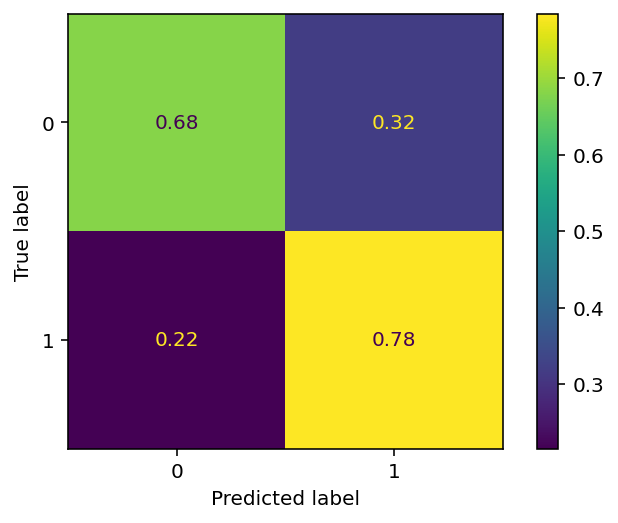

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,lgc.predict(X_val_scale),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
from sklearn.metrics import accuracy_score

y_val_pred = lgc.predict(X_val_scale)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7384155455904334

### **Sequential feature selection**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from mlxtend.feature_selection import SequentialFeatureSelector

# Create a StratifiedKFold cross-validation object
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize your Logistic Regression model
lgc = LogisticRegression(multi_class='ovr', solver='liblinear')

# Initialize the Sequential Feature Selector
sfs = SequentialFeatureSelector(lgc,
                                k_features='best',  # Select the best subset of features
                                forward=True,        # Forward selection (you can also try backward=False)
                                scoring='accuracy',  # Use accuracy as the evaluation metric
                                cv=kfold)

# Fit the SFS to your training data
sfs.fit(X_train_scale, y_train)

# Get the selected feature indices
selected_features_indices = np.array(sfs.k_feature_idx_)

# Get the names of the selected features
selected_feature_names = X_train_scale.columns[selected_features_indices]

# Select the features from your training data
X_train_selected = X_train_scale[selected_feature_names]

# Train your Logistic Regression model on the selected features
lgc.fit(X_train_selected, y_train)

# Print the selected feature names
print("Selected feature names:", selected_feature_names)


Selected feature names: Index(['HS', 'HST', 'AST', 'HF', 'HC', 'AC', 'HY', 'HR', 'AvgH', 'MaxA',
       'Max>2.5', 'Avg>2.5', 'Avg<2.5', 'TGD', 'Days_D', 'form_diff', 'MW',
       'Year', 'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff'],
      dtype='object')


In [ ]:

# evaluate the model on your validation or test set
X_val_selected = X_val_scale[selected_feature_names]
y_val_pred = lgc.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7354260089686099

### **gridsearchCV**

In [ ]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score


param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'class_weight': ['balanced', None]
}


lg = LogisticRegression(multi_class='ovr', solver='liblinear')

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

scorer = make_scorer(f1_score, average='weighted')

grid_search = GridSearchCV(estimator=lg, param_grid=param_grid, scoring=scorer, cv=kfold,return_train_score=True)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

grid_search.fit(X_train_fold_resampled, y_train_fold_resampled)


best_estimator = grid_search.best_estimator_

In [ ]:
y_val_fold.value_counts()

NH    297
H     238
Name: WNW, dtype: int64

In [ ]:
y_train.value_counts()

NH    1481
H     1194
Name: WNW, dtype: int64

In [ ]:
y_train_fold_resampled.value_counts()

NH    1184
H     1184
Name: WNW, dtype: int64

In [ ]:
grid_search.best_score_

0.7524757987937243

In [ ]:
grid_search.best_params_

{'C': 0.1, 'class_weight': 'balanced', 'penalty': 'l1'}

In [ ]:
grid_search.best_index_

8

In [ ]:
lg_results = pd.DataFrame(grid_search.cv_results_).sort_values('rank_test_score')

In [ ]:
lg_results.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'param_class_weight', 'param_penalty', 'params',
       'split0_test_score', 'split1_test_score', 'split2_test_score',
       'split3_test_score', 'split4_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'split3_train_score',
       'split4_train_score', 'mean_train_score', 'std_train_score'],
      dtype='object')

In [ ]:
lg_results[['param_C', 'param_class_weight', 'param_penalty','mean_train_score','mean_test_score','rank_test_score']]

,param_C,param_class_weight,param_penalty,mean_train_score,mean_test_score,rank_test_score
8,0.1,balanced,l1,0.757281,0.752476,1
10,0.1,None,l1,0.757281,0.752476,1
5,0.01,balanced,l2,0.749793,0.748205,3
7,0.01,None,l2,0.749686,0.748205,3
14,1,None,l1,0.756002,0.747797,5
12,1,balanced,l1,0.756213,0.747797,5
11,0.1,None,l2,0.755159,0.747782,7
15,1,None,l2,0.754735,0.747367,8
13,1,balanced,l2,0.754735,0.747367,8
18,10,None,l1,0.755159,0.747355,10


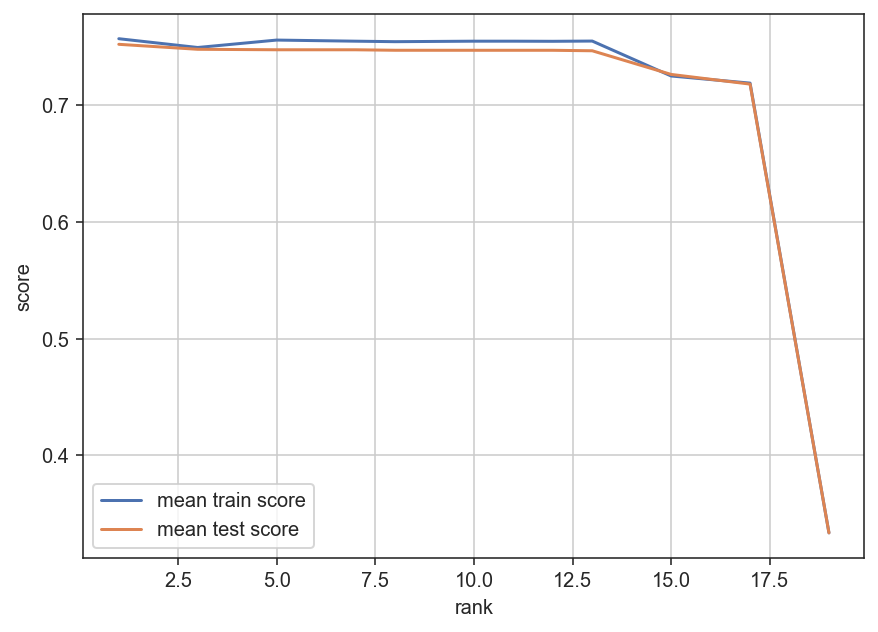

In [ ]:
fig,ax = plt.subplots(figsize=(7,5))
sns.lineplot(data=lg_results,x='rank_test_score',y='mean_train_score',ax=ax,errorbar=None)
sns.lineplot(data=lg_results,x='rank_test_score',y='mean_test_score',ax=ax,errorbar=None)
ax.legend(['mean train score','mean test score'])
ax.set_xlabel('rank')
ax.set_ylabel('score')
plt.grid(visible=True)

In [ ]:
winning_lgc = grid_search.best_estimator_

In [ ]:
from sklearn.metrics import classification_report

y_pred_lg = winning_lgc.predict(X_val_selected)
class_report_lg = classification_report(y_val, y_pred_lg)
print("\nClassification Report:")
print(class_report_lg)


Classification Report:
              precision    recall  f1-score   support

           H       0.69      0.74      0.71       298
          NH       0.78      0.73      0.75       371

    accuracy                           0.74       669
   macro avg       0.73      0.74      0.73       669
weighted avg       0.74      0.74      0.74       669



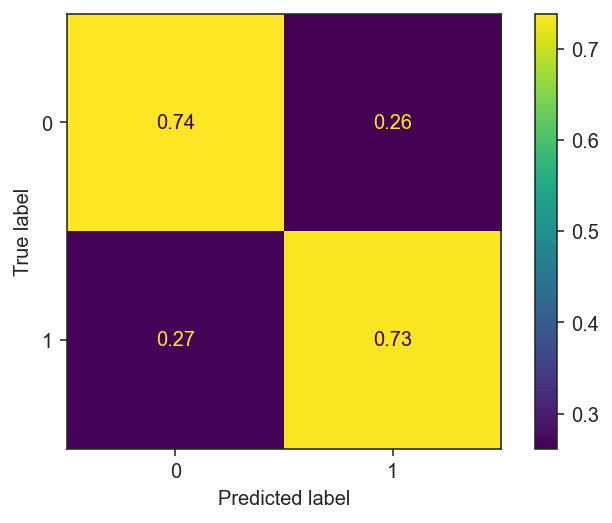

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,winning_lgc.predict(X_val_selected),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
# evaluate the model on your validation or test set
X_val_selected = X_val_scale[selected_feature_names]
y_val_pred = winning_lgc.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7354260089686099

## **RandomForest Classifier**

### **Fitting a simple model**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()

In [ ]:
rfc.fit(X_train,y_train)

RandomForestClassifier()

In [ ]:
y_pred_rfc = rfc.predict(X_val)
class_report_rfc = classification_report(y_val, y_pred_rfc)
print("\nClassification Report:")
print(class_report_rfc)


Classification Report:
              precision    recall  f1-score   support

           H       0.70      0.59      0.64       298
          NH       0.71      0.80      0.75       371

    accuracy                           0.71       669
   macro avg       0.70      0.69      0.70       669
weighted avg       0.70      0.71      0.70       669



In [ ]:
from sklearn.metrics import accuracy_score

y_val_pred = rfc.predict(X_val)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7055306427503737

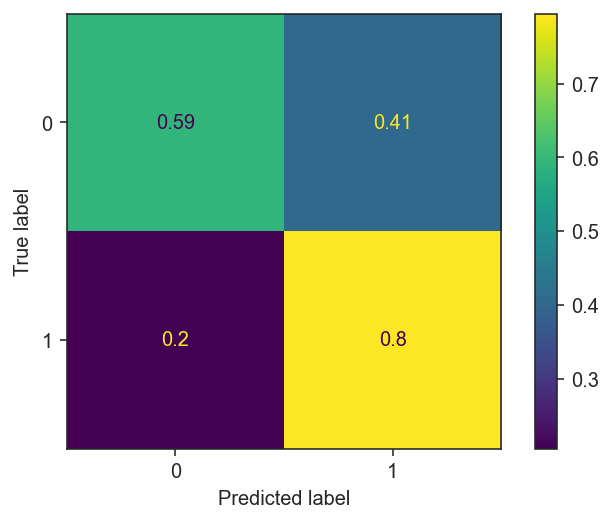

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,rfc.predict(X_val),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

### **Sequential feature selection**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from mlxtend.feature_selection import SequentialFeatureSelector

# Create a StratifiedKFold cross-validation object
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize Random Forest model
rfc = RandomForestClassifier()

# Initialize the Sequential Feature Selector
sfs = SequentialFeatureSelector(rfc,
                                k_features='best',  # Select the best subset of features
                                forward=True,        # Forward selection (you can also try backward=False)
                                scoring='accuracy',  # Use accuracy as the evaluation metric
                                cv=kfold)

# Fit the rfc to your training data
sfs.fit(X_train_scale, y_train)

# Get the selected feature indices
selected_features_indices = np.array(sfs.k_feature_idx_)

# Get the names of the selected features
selected_feature_names = X_train.columns[selected_features_indices]

# Select the features from your training data
X_train_selected = X_train[selected_feature_names]

# Train your Logistic Regression model on the selected features
rfc.fit(X_train_selected, y_train)

# Print the selected feature names
print("Selected feature names:", selected_feature_names)


Selected feature names: Index(['HS', 'AS', 'HST', 'AST', 'HC', 'AC', 'HY', 'HR', 'AR', 'AvgH', 'MaxA',
       'MW', 'Max<2.5', 'Days_D', 'Attack_diff'],
      dtype='object')


In [ ]:

# evaluate the model on your validation or test set
X_val_selected = X_val[selected_feature_names]
y_val_pred = rfc.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7204783258594918

### **gridsearchCV**

In [ ]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score


param_grid = {
    'n_estimators': [5,10,50,100],
    'max_depth': [3,5,8,10,20],
    'min_samples_split': [2,5,8,10,20],
    'min_samples_leaf':[2,5,10,20],
    'n_jobs':[-1],
    'random_state':[42]
}


rfc = RandomForestClassifier()

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

scorer = make_scorer(f1_score, average='weighted')

grid_search = GridSearchCV(estimator=rfc, param_grid=param_grid, scoring=scorer, cv=kfold, return_train_score=True)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

grid_search.fit(X_train_fold_resampled, y_train_fold_resampled)


best_estimator = grid_search.best_estimator_

In [ ]:
y_val_fold.value_counts()

NH    297
H     238
Name: WNW, dtype: int64

In [ ]:
y_train.value_counts()

NH    1481
H     1194
Name: WNW, dtype: int64

In [ ]:
y_train_fold_resampled.value_counts()

NH    1184
H     1184
Name: WNW, dtype: int64

In [ ]:
grid_search.best_score_

0.7600360120419453

In [ ]:
grid_search.best_params_

{'max_depth': 10,
 'min_samples_leaf': 2,
 'min_samples_split': 20,
 'n_estimators': 100,
 'n_jobs': -1,
 'random_state': 42}

In [ ]:
grid_search.best_index_

259

In [ ]:
rfc_results = pd.DataFrame(grid_search.cv_results_).sort_values('rank_test_score')

In [ ]:
rfc_results.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_max_depth', 'param_min_samples_leaf', 'param_min_samples_split',
       'param_n_estimators', 'param_n_jobs', 'param_random_state', 'params',
       'split0_test_score', 'split1_test_score', 'split2_test_score',
       'split3_test_score', 'split4_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'split3_train_score',
       'split4_train_score', 'mean_train_score', 'std_train_score'],
      dtype='object')

In [ ]:
rfc_results[['param_max_depth', 'param_min_samples_leaf', 'param_min_samples_split','param_n_estimators','mean_train_score','mean_test_score','rank_test_score']]

,param_max_depth,param_min_samples_leaf,param_min_samples_split,param_n_estimators,mean_train_score,mean_test_score,rank_test_score
259,10,2,20,100,0.879959,0.760036,1
247,10,2,5,100,0.938872,0.759228,2
359,20,5,20,100,0.875944,0.757454,3
323,20,2,2,100,0.990920,0.757159,4
326,20,2,5,50,0.983847,0.757105,5
...,...,...,...,...,...,...,...
61,3,20,2,10,0.716909,0.703747,396
73,3,20,10,10,0.716909,0.703747,396
65,3,20,5,10,0.716909,0.703747,396
69,3,20,8,10,0.716909,0.703747,396


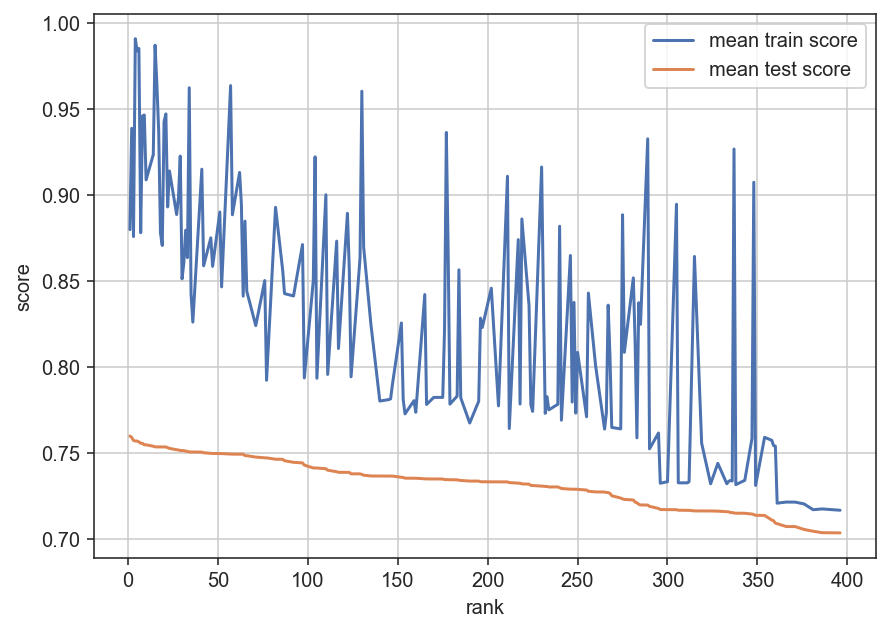

In [ ]:
fig,ax = plt.subplots(figsize=(7,5))
sns.lineplot(data=rfc_results,x='rank_test_score',y='mean_train_score',ax=ax,errorbar=None)
sns.lineplot(data=rfc_results,x='rank_test_score',y='mean_test_score',ax=ax,errorbar=None)
ax.legend(['mean train score','mean test score'])
ax.set_xlabel('rank')
ax.set_ylabel('score')
plt.grid(visible=True)

In [ ]:
winning_rfc = grid_search.best_estimator_

In [ ]:
winning_rfc

RandomForestClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=20,
                       n_jobs=-1, random_state=42)

In [ ]:
from sklearn.metrics import classification_report

y_pred_lg = winning_rfc.predict(X_val_selected)
class_report_lg = classification_report(y_val, y_pred_lg)
print("\nClassification Report:")
print(class_report_lg)


Classification Report:
              precision    recall  f1-score   support

           H       0.70      0.67      0.68       298
          NH       0.74      0.77      0.75       371

    accuracy                           0.72       669
   macro avg       0.72      0.72      0.72       669
weighted avg       0.72      0.72      0.72       669



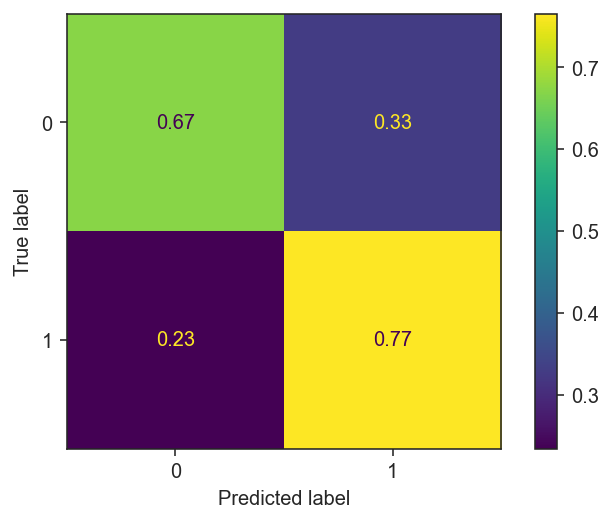

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,winning_rfc.predict(X_val_selected),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
# evaluate the model on your validation or test set
X_val_selected = X_val[selected_feature_names]
y_val_pred = winning_rfc.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7234678624813154

In [ ]:
rfc_results['diff']=abs(rfc_results['mean_train_score']-rfc_results['mean_test_score'])

sorted_table = rfc_results[['param_max_depth', 'param_min_samples_leaf', 'param_min_samples_split',\
                            'param_n_estimators','mean_train_score','mean_test_score','diff','rank_test_score']]\
                            .sort_values(by=['diff', 'mean_test_score'], ascending=[True, False])
sorted_table

,param_max_depth,param_min_samples_leaf,param_min_samples_split,param_n_estimators,mean_train_score,mean_test_score,diff,rank_test_score
68,3,20,8,5,0.721016,0.709114,0.011902,361
60,3,20,2,5,0.721016,0.709114,0.011902,361
72,3,20,10,5,0.721016,0.709114,0.011902,361
76,3,20,20,5,0.721016,0.709114,0.011902,361
64,3,20,5,5,0.721016,0.709114,0.011902,361
...,...,...,...,...,...,...,...,...
325,20,2,5,10,0.960409,0.737729,0.222680,130
326,20,2,5,50,0.983847,0.757105,0.226742,5
327,20,2,5,100,0.985219,0.756606,0.228614,6
322,20,2,2,50,0.987120,0.753731,0.233388,15


In [ ]:
X_train_selected = X_train[['HS', 'AS', 'HST', 'AST', 'HC', 'AC', 'HY', 'HR', 'AR', 'AvgH', 'MaxA',\
       'MW', 'Max<2.5', 'Days_D', 'Attack_diff']]

X_val_selected = X_val[['HS', 'AS', 'HST', 'AST', 'HC', 'AC', 'HY', 'HR', 'AR', 'AvgH', 'MaxA',\
       'MW', 'Max<2.5', 'Days_D', 'Attack_diff']]

In [ ]:
# Select the top model (small gap and high test score)
first_model = sorted_table.iloc[0]

# Display the first model's information
print("first Model:")
print(first_model)

first Model:
param_max_depth                   3
param_min_samples_leaf           20
param_min_samples_split           8
param_n_estimators                5
mean_train_score           0.721016
mean_test_score            0.709114
diff                       0.011902
rank_test_score                 361
Name: 68, dtype: object


In [ ]:
# Define hyperparameters for the first model (adjust these values based on your first model)
first_model_hyperparameters = {
    'max_depth': 3,
    'min_samples_leaf': 20,
    'min_samples_split': 8,
    'n_estimators': 5
}

# Create a new instance of the RandomForestClassifier with the first model's hyperparameters
first_rfc = RandomForestClassifier(**first_model_hyperparameters)

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

first_rfc.fit(X_train_fold_resampled, y_train_fold_resampled)

y_val_pred = first_rfc.predict(X_val_selected)

# Calculate the validation accuracy
val_accuracy = accuracy_score(y_val, y_val_pred)

# Print the validation accuracy
print("Validation Accuracy:", val_accuracy)


Validation Accuracy: 0.6741405082212257


In [ ]:
from sklearn.metrics import classification_report

y_pred_rfc = first_rfc.predict(X_val_selected)
class_report_rfc = classification_report(y_val, y_pred_rfc, zero_division='warn')
print("\nClassification Report:")
print(class_report_rfc)



Classification Report:
              precision    recall  f1-score   support

           H       0.64      0.60      0.62       298
          NH       0.70      0.73      0.71       371

    accuracy                           0.67       669
   macro avg       0.67      0.67      0.67       669
weighted avg       0.67      0.67      0.67       669



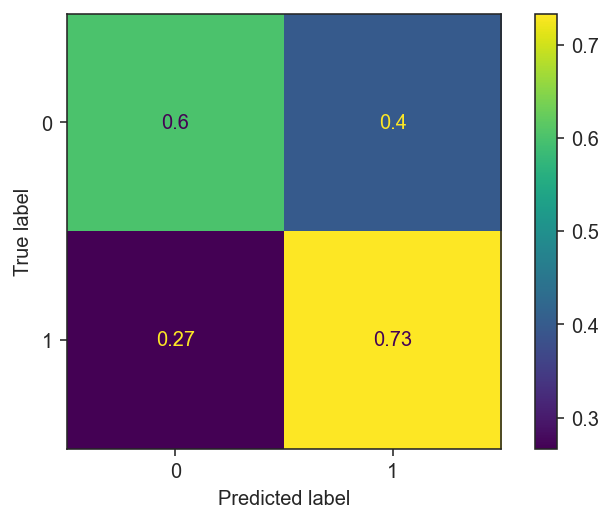

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,first_rfc.predict(X_val_selected),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
# # Calculate the index of the middle row
# middle_index = len(sorted_table) // 2

# # Select the model from the middle
# middle_model = sorted_table.iloc[middle_index]
# middle_model

In [ ]:
# # Define hyperparameters for the middle model (adjust these values based on your middle model)
# middle_model_hyperparameters = {
#     'max_depth': 20,
#     'min_samples_leaf': 20,
#     'min_samples_split': 10,
#     'n_estimators': 10
# }

# # Create a new instance of the RandomForestClassifier with the middle model's hyperparameters
# middle_rfc = RandomForestClassifier(**middle_model_hyperparameters)

# # Fit the model to your training data
# middle_rfc.fit(X_train_selected, y_train)

# # Use the middle model estimator to make predictions
# X_val_selected = X_val[selected_feature_names]
# y_val_pred = middle_rfc.predict(X_val_selected)

# # Calculate the validation accuracy
# val_accuracy = accuracy_score(y_val, y_val_pred)

# # Print the validation accuracy
# print("Validation Accuracy:", val_accuracy)


In [ ]:
# from sklearn.metrics import classification_report

# y_pred_lg = middle_rfc.predict(X_val_selected)
# class_report_lg = classification_report(y_val, y_pred_lg)
# print("\nClassification Report:")
# print(class_report_lg)

## **HistGradientBoosting classifier**

### **Fitting a simple model**

In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier

In [ ]:
hgc = HistGradientBoostingClassifier()

In [ ]:
hgc.fit(X_train,y_train)

HistGradientBoostingClassifier()

In [ ]:
from sklearn.metrics import classification_report

y_pred_hgc = hgc.predict(X_val)
class_report_hgc = classification_report(y_val, y_pred_hgc)
print("\nClassification Report:")
print(class_report_hgc)


Classification Report:
              precision    recall  f1-score   support

           H       0.70      0.64      0.67       298
          NH       0.73      0.78      0.76       371

    accuracy                           0.72       669
   macro avg       0.72      0.71      0.71       669
weighted avg       0.72      0.72      0.72       669



In [ ]:
from sklearn.metrics import accuracy_score

y_val_pred = hgc.predict(X_val)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7204783258594918

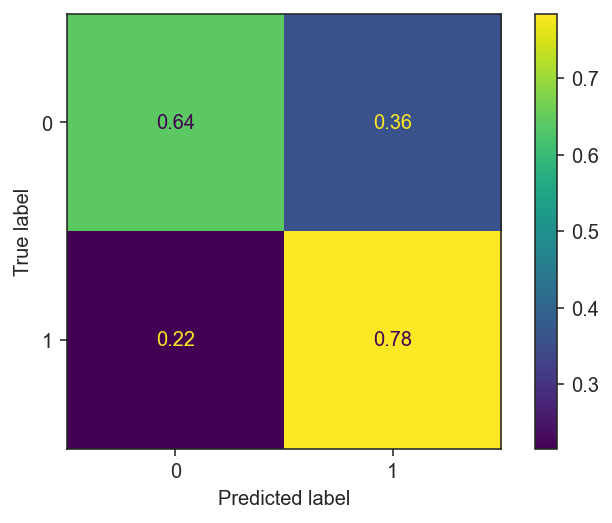

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,hgc.predict(X_val),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

### **Sequential feature selection**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from mlxtend.feature_selection import SequentialFeatureSelector

# Create a StratifiedKFold cross-validation object
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize Random Forest model
hgc = HistGradientBoostingClassifier()

# Initialize the Sequential Feature Selector
sfs = SequentialFeatureSelector(hgc,
                                k_features='best',  # Select the best subset of features
                                forward=True,        # Forward selection (you can also try backward=False)
                                scoring='accuracy',  # Use accuracy as the evaluation metric
                                cv=kfold)

# Fit the hgc to your training data
sfs.fit(X_train_scale, y_train)

# Get the selected feature indices
selected_features_indices = np.array(sfs.k_feature_idx_)

# Get the names of the selected features
selected_feature_names = X_train.columns[selected_features_indices]

# Select the features from your training data
X_train_selected = X_train[selected_feature_names]

# Train your Logistic Regression model on the selected features
hgc.fit(X_train_selected, y_train)

# Print the selected feature names
print("Selected feature names:", selected_feature_names)


Selected feature names: Index(['HS', 'AS', 'HST', 'AST', 'HF', 'HC', 'AC', 'HY', 'AY', 'HR', 'AR',
       'AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA', 'MW', 'Year', 'Max>2.5',
       'Max<2.5', 'Avg>2.5', 'TGD', 'Elo_Before_Home', 'Days_D', 'form_diff',
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff'],
      dtype='object')


In [ ]:

# evaluate the model on your validation or test set
X_val_selected = X_val[selected_feature_names]
y_val_pred = hgc.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7384155455904334

In [ ]:
X_train_selected = X_train[selected_feature_names]

In [ ]:
X_train_selected.columns

Index(['HS', 'AS', 'HST', 'AST', 'HF', 'HC', 'AC', 'HY', 'AY', 'HR', 'AR',
       'AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA', 'MW', 'Year', 'Max>2.5',
       'Max<2.5', 'Avg>2.5', 'TGD', 'Elo_Before_Home', 'Days_D', 'form_diff',
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff'],
      dtype='object')

In [ ]:
X_val_selected = X_val[selected_feature_names]
X_val_selected.columns

Index(['HS', 'AS', 'HST', 'AST', 'HF', 'HC', 'AC', 'HY', 'AY', 'HR', 'AR',
       'AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA', 'MW', 'Year', 'Max>2.5',
       'Max<2.5', 'Avg>2.5', 'TGD', 'Elo_Before_Home', 'Days_D', 'form_diff',
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff'],
      dtype='object')

### **gridsearchCV**

In [ ]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.ensemble import HistGradientBoostingClassifier
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score


param_grid = {
    'max_iter': [50,100,200],
    'max_depth': [3,5,8,10,20],
    'max_leaf_nodes': [20, 50, 100, 200],
    'min_samples_leaf':[2,5,10,20],
    'random_state':[42],
    'learning_rate': [0.1, 0.5],
    'l2_regularization': [0,0.1,0.01]

}


hgc = HistGradientBoostingClassifier()

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

scorer = make_scorer(f1_score, average='weighted')

grid_search = GridSearchCV(estimator=hgc, param_grid=param_grid, scoring=scorer, cv=kfold, return_train_score=True)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

grid_search.fit(X_train_fold_resampled, y_train_fold_resampled)


best_estimator = grid_search.best_estimator_

In [ ]:
y_val_fold.value_counts()

NH    297
H     238
Name: WNW, dtype: int64

In [ ]:
y_train.value_counts()

NH    1481
H     1194
Name: WNW, dtype: int64

In [ ]:
y_train_fold_resampled.value_counts()

NH    1184
H     1184
Name: WNW, dtype: int64

In [ ]:
grid_search.best_score_

0.7617638607424169

In [ ]:
grid_search.best_params_

{'l2_regularization': 0.1,
 'learning_rate': 0.1,
 'max_depth': 3,
 'max_iter': 100,
 'max_leaf_nodes': 20,
 'min_samples_leaf': 20,
 'random_state': 42}

In [ ]:
grid_search.best_index_

499

In [ ]:
hgb_results = pd.DataFrame(grid_search.cv_results_).sort_values('rank_test_score')

In [ ]:
hgb_results.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_l2_regularization', 'param_learning_rate', 'param_max_depth',
       'param_max_iter', 'param_max_leaf_nodes', 'param_min_samples_leaf',
       'param_random_state', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'split0_train_score', 'split1_train_score',
       'split2_train_score', 'split3_train_score', 'split4_train_score',
       'mean_train_score', 'std_train_score'],
      dtype='object')

In [ ]:
hgb_results[['param_max_iter', 'param_max_depth', 'param_max_leaf_nodes','param_min_samples_leaf','param_learning_rate','param_l2_regularization','mean_train_score','mean_test_score','rank_test_score']]

,param_max_iter,param_max_depth,param_max_leaf_nodes,param_min_samples_leaf,param_learning_rate,param_l2_regularization,mean_train_score,mean_test_score,rank_test_score
511,100,3,200,20,0.1,0.1,0.850287,0.761764,1
507,100,3,100,20,0.1,0.1,0.850287,0.761764,1
503,100,3,50,20,0.1,0.1,0.850287,0.761764,1
499,100,3,20,20,0.1,0.1,0.850287,0.761764,1
1010,50,5,20,10,0.1,0.01,0.897908,0.761614,5
...,...,...,...,...,...,...,...,...,...
768,50,5,20,2,0.5,0.1,1.000000,0.728704,1436
1251,50,5,20,20,0.5,0.01,0.999367,0.727997,1437
818,50,8,20,10,0.5,0.1,1.000000,0.726696,1438
1344,50,10,20,2,0.5,0.01,1.000000,0.726689,1439


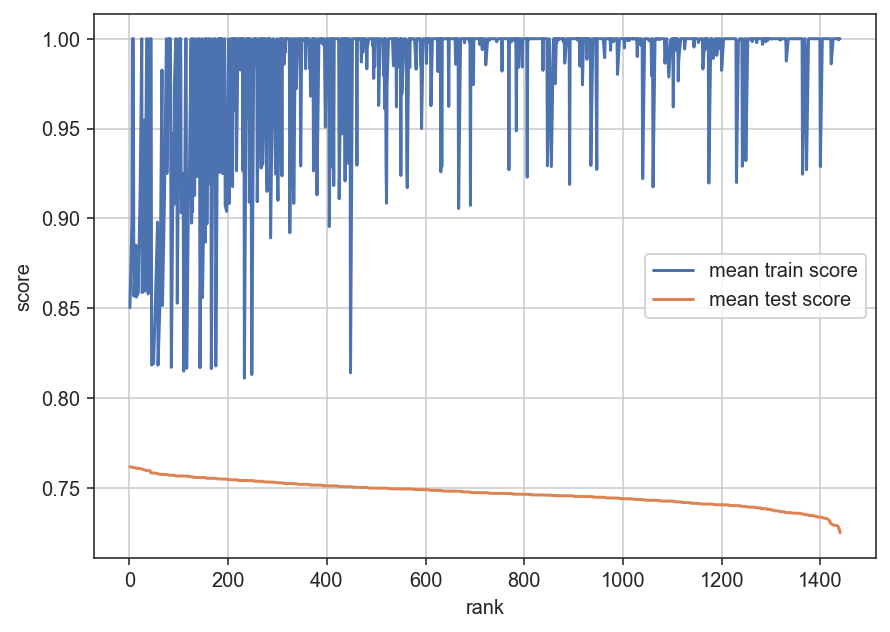

In [ ]:
fig,ax = plt.subplots(figsize=(7,5))
sns.lineplot(data=hgb_results,x='rank_test_score',y='mean_train_score',ax=ax,errorbar=None)
sns.lineplot(data=hgb_results,x='rank_test_score',y='mean_test_score',ax=ax,errorbar=None)
ax.legend(['mean train score','mean test score'])
ax.set_xlabel('rank')
ax.set_ylabel('score')
plt.grid(visible=True)

In [ ]:
winning_hgb = grid_search.best_estimator_

In [ ]:
winning_hgb

HistGradientBoostingClassifier(l2_regularization=0.1, max_depth=3,
                               max_leaf_nodes=20, random_state=42)

In [ ]:
from sklearn.metrics import classification_report

y_pred_hgb = winning_hgb.predict(X_val_selected)
class_report_hgb = classification_report(y_val, y_pred_hgb)
print("\nClassification Report:")
print(class_report_hgb)


Classification Report:
              precision    recall  f1-score   support

           H       0.70      0.71      0.71       298
          NH       0.77      0.75      0.76       371

    accuracy                           0.74       669
   macro avg       0.73      0.73      0.73       669
weighted avg       0.74      0.74      0.74       669



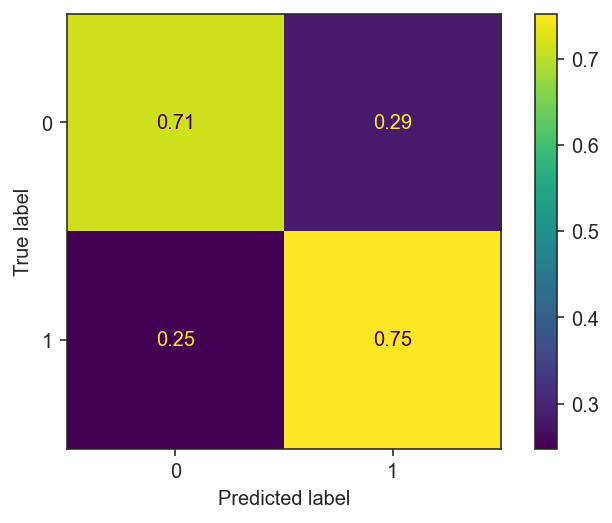

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,winning_hgb.predict(X_val_selected),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
# evaluate the model on your validation or test set
X_val_selected = X_val[selected_feature_names]
y_val_pred = winning_hgb.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7354260089686099

In [ ]:
X_train_selected = X_train[['HS', 'AS', 'HST', 'AST', 'HF', 'HC', 'AC', 'HY', 'AY', 'HR', 'AR',\
       'AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA', 'MW', 'Year', 'Max>2.5',\
       'Max<2.5', 'Avg>2.5', 'TGD', 'Elo_Before_Home', 'Days_D', 'form_diff',\
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff']]

X_val_selected = X_val[['HS', 'AS', 'HST', 'AST', 'HF', 'HC', 'AC', 'HY', 'AY', 'HR', 'AR',\
       'AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA', 'MW', 'Year', 'Max>2.5',\
       'Max<2.5', 'Avg>2.5', 'TGD', 'Elo_Before_Home', 'Days_D', 'form_diff',\
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff']]

In [ ]:
hgb_results['diff']=abs(hgb_results['mean_train_score']-hgb_results['mean_test_score'])

sorted_table = hgb_results[['param_l2_regularization', 'param_learning_rate', 'param_max_depth',\
       'param_max_iter', 'param_max_leaf_nodes', 'param_min_samples_leaf','mean_train_score','mean_test_score','diff','rank_test_score']]\
                            .sort_values(by=['diff', 'mean_test_score'], ascending=[True, False])
sorted_table

,param_l2_regularization,param_learning_rate,param_max_depth,param_max_iter,param_max_leaf_nodes,param_min_samples_leaf,mean_train_score,mean_test_score,diff,rank_test_score
495,0.1,0.1,3,50,200,20,0.811117,0.754139,0.056978,233
491,0.1,0.1,3,50,100,20,0.811117,0.754139,0.056978,233
483,0.1,0.1,3,50,20,20,0.811117,0.754139,0.056978,233
487,0.1,0.1,3,50,50,20,0.811117,0.754139,0.056978,233
490,0.1,0.1,3,50,100,10,0.815029,0.756641,0.058388,110
...,...,...,...,...,...,...,...,...,...,...
768,0.1,0.5,5,50,20,2,1.000000,0.728704,0.271296,1436
1251,0.01,0.5,5,50,20,20,0.999367,0.727997,0.271369,1437
818,0.1,0.5,8,50,20,10,1.000000,0.726696,0.273304,1438
1344,0.01,0.5,10,50,20,2,1.000000,0.726689,0.273311,1439


In [ ]:
sorted_table.iloc[0]

param_l2_regularization         0.1
param_learning_rate             0.1
param_max_depth                   3
param_max_iter                   50
param_max_leaf_nodes            200
param_min_samples_leaf           20
mean_train_score           0.811117
mean_test_score            0.754139
diff                       0.056978
rank_test_score                 233
Name: 495, dtype: object

In [ ]:
# Select the top model (small gap and high test score)
first_model = sorted_table.iloc[0]

# Display the first model's information
print("first Model:")
print(first_model)

first Model:
param_l2_regularization         0.1
param_learning_rate             0.1
param_max_depth                   3
param_max_iter                   50
param_max_leaf_nodes            200
param_min_samples_leaf           20
mean_train_score           0.811117
mean_test_score            0.754139
diff                       0.056978
rank_test_score                 233
Name: 495, dtype: object


In [ ]:
# Define hyperparameters for the first model (adjust these values based on your first model)
first_model_hyperparameters = {
    'l2_regularization': 0.1,
    'learning_rate': 0.1,
    'max_depth': 3,
    'max_leaf_nodes': 200,
    'min_samples_leaf': 20,
    'max_iter': 50
}

# Create a new instance of the HistGradientBoostingClassifier with the first model's hyperparameters
first_hgb = HistGradientBoostingClassifier(**first_model_hyperparameters)

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

first_hgb.fit(X_train_fold_resampled, y_train_fold_resampled)

# Use the first model estimator to make predictions
y_val_pred = first_hgb.predict(X_val_selected)

# Calculate the validation accuracy
val_accuracy = accuracy_score(y_val, y_val_pred)

# Print the validation accuracy
print("Validation Accuracy:", val_accuracy)


Validation Accuracy: 0.7339312406576981


In [ ]:
from sklearn.metrics import classification_report

y_pred_hgb = first_hgb.predict(X_val_selected)
class_report_hgb = classification_report(y_val, y_pred_hgb)
print("\nClassification Report:")
print(class_report_hgb)


Classification Report:
              precision    recall  f1-score   support

           H       0.70      0.71      0.70       298
          NH       0.76      0.75      0.76       371

    accuracy                           0.73       669
   macro avg       0.73      0.73      0.73       669
weighted avg       0.73      0.73      0.73       669



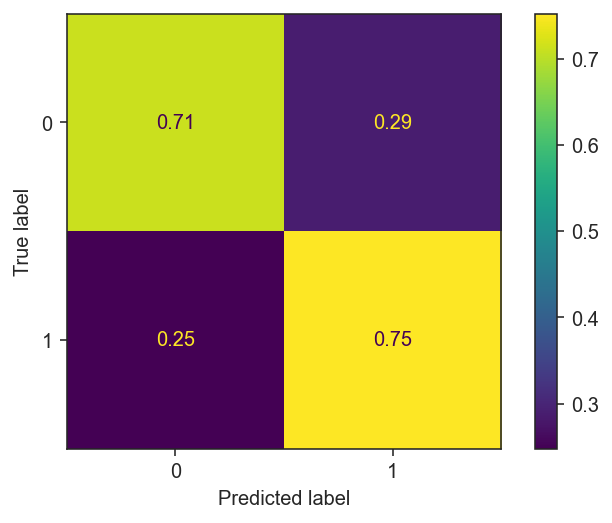

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,first_hgb.predict(X_val_selected),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

## **K- Nearest neighbor**

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor()

### scaling the data

In [ ]:
norm_cols=['MW', 'Year','Overall_diff', 'Attack_diff',\
       'Midfield_diff', 'Defence_diff']

In [ ]:
std_cols = [col for col in X_train.columns if col not in norm_cols]

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,Normalizer

In [ ]:
# Create transformers
stdscaling_transformer = StandardScaler()
normscaling_transformer = Normalizer()

# Create a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("std", stdscaling_transformer, std_cols),
        ("norm", normscaling_transformer, norm_cols)
    ],
    remainder='passthrough'
)

# Apply the transformations and convert back to a pandas DataFrame
X_train_scale = preprocessor.fit_transform(X_train)
X_train_scale = pd.DataFrame(X_train_scale, columns=std_cols + norm_cols)

In [ ]:
X_train_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,0.007046,0.549229,-0.009621,0.364080,0.725299,-1.375716,0.367912,-1.743391,1.207190,-1.369708,...,-0.136565,0.100487,-0.009676,0.017246,0.000993,0.999987,0.002483,0.002483,0.001986,0.002979
1,-0.348570,-0.880736,-0.714737,-0.036873,-1.348171,1.688199,-0.936050,0.119653,-0.438279,1.722248,...,0.782275,4.476563,-0.025650,-0.789449,0.003954,0.999990,-0.000989,-0.000989,0.000000,-0.001483
2,0.007046,-0.267894,-0.714737,-0.437826,0.132879,0.295510,1.019894,0.492261,1.207190,0.176270,...,-1.419827,-0.085729,0.553088,0.823941,0.015879,0.999865,0.002481,0.001985,0.001985,0.001985
3,-1.237611,-1.085017,-1.067295,-0.838778,-0.163331,-0.261565,-1.262041,0.492261,-0.438279,0.949259,...,1.323745,0.007379,0.101380,0.017246,0.003962,0.999987,-0.001486,0.000000,-0.002476,-0.000991
4,-0.881995,1.570633,-1.419853,1.165986,3.687399,0.295510,-1.262041,1.610088,1.207190,0.176270,...,-0.238686,10.528583,0.084392,-0.386102,0.004449,0.999983,-0.001977,-0.001977,-0.000989,-0.002472


In [ ]:
X_val_scale = preprocessor.fit_transform(X_val)
X_val_scale = pd.DataFrame(X_val_scale, columns=std_cols + norm_cols)

X_val_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-0.320599,-0.312972,0.685797,-0.896903,1.375084,0.608376,-0.550323,-0.677915,-0.429814,1.869933,...,0.025540,-1.524894,-0.176214,0.482873,0.014334,0.999893,-0.000989,-0.001977,-0.001483,-0.000989
1,1.411877,-0.518244,0.685797,0.348830,-0.736926,-0.550353,1.007063,-0.677915,0.389404,-0.532727,...,-0.795764,0.004445,0.520097,0.674722,0.017828,0.999841,0.000495,0.000000,0.000495,0.000000
2,0.545639,0.508119,0.017968,-0.066414,-1.340357,-0.550353,-0.550323,-0.321090,0.389404,0.268159,...,0.302770,-0.080518,-0.066477,-0.476373,0.005940,0.999925,0.004950,0.006435,0.005445,0.004455
3,-0.493846,-0.928789,-1.317689,-0.896903,-1.340357,-1.129717,0.072631,-0.677915,0.389404,1.069046,...,0.492413,-0.080518,-0.509134,-1.243770,0.011374,0.999923,-0.002473,-0.002473,-0.002967,-0.001978
4,-0.147351,-0.928789,-0.315946,-1.312147,-0.435210,-0.260671,2.564449,-0.677915,-1.249032,-0.532727,...,-2.544650,-0.080518,2.418901,1.825818,0.016862,0.999829,0.002976,0.005951,0.003472,0.000992


### Fitting simple model

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()

In [ ]:
knn.fit(X_train_scale,y_train)

KNeighborsClassifier()

In [ ]:
X_train_scale

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,0.007046,0.549229,-0.009621,0.364080,0.725299,-1.375716,0.367912,-1.743391,1.207190,-1.369708,...,-0.136565,0.100487,-0.009676,0.017246,0.000993,0.999987,0.002483,0.002483,0.001986,0.002979
1,-0.348570,-0.880736,-0.714737,-0.036873,-1.348171,1.688199,-0.936050,0.119653,-0.438279,1.722248,...,0.782275,4.476563,-0.025650,-0.789449,0.003954,0.999990,-0.000989,-0.000989,0.000000,-0.001483
2,0.007046,-0.267894,-0.714737,-0.437826,0.132879,0.295510,1.019894,0.492261,1.207190,0.176270,...,-1.419827,-0.085729,0.553088,0.823941,0.015879,0.999865,0.002481,0.001985,0.001985,0.001985
3,-1.237611,-1.085017,-1.067295,-0.838778,-0.163331,-0.261565,-1.262041,0.492261,-0.438279,0.949259,...,1.323745,0.007379,0.101380,0.017246,0.003962,0.999987,-0.001486,0.000000,-0.002476,-0.000991
4,-0.881995,1.570633,-1.419853,1.165986,3.687399,0.295510,-1.262041,1.610088,1.207190,0.176270,...,-0.238686,10.528583,0.084392,-0.386102,0.004449,0.999983,-0.001977,-0.001977,-0.000989,-0.002472
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2670,1.251703,0.140667,0.342937,0.364080,-0.459541,-1.375716,0.367912,0.864870,-1.261013,-1.369708,...,-0.104889,0.007379,0.279122,0.218920,0.007437,0.999963,0.002479,0.002479,0.002479,0.000992
2671,0.896086,-1.085017,1.400611,-0.838778,-0.163331,1.409662,2.323856,-1.370782,-0.438279,0.949259,...,-1.438023,0.007379,-0.792779,0.017246,0.013874,0.999903,0.000495,0.000495,0.000991,-0.000495
2672,1.785127,-0.063613,1.048053,0.364080,-0.755751,-0.540103,0.693903,-0.998174,0.384455,-0.596719,...,-0.188736,0.100487,0.024173,0.218920,0.002978,0.999994,0.000993,0.000993,0.000496,0.000000
2673,1.429511,-0.063613,1.048053,-0.036873,0.132879,-0.540103,0.693903,-0.998174,-0.438279,-0.596719,...,0.474371,0.100487,0.741098,-1.192797,0.018286,0.999812,0.002965,0.004942,0.002471,0.001483


In [ ]:
print(X_val_scale.dtypes)

HS                 float64
AS                 float64
HST                float64
AST                float64
HF                 float64
AF                 float64
HC                 float64
AC                 float64
HY                 float64
AY                 float64
HR                 float64
AR                 float64
AvgH               float64
AvgD               float64
AvgA               float64
MaxH               float64
MaxD               float64
MaxA               float64
Max>2.5            float64
Max<2.5            float64
Avg>2.5            float64
Avg<2.5            float64
TGD                float64
Prob_D             float64
Elo_Before_Home    float64
Elo_Before_Away    float64
Days_D             float64
form_diff          float64
SP_diff            float64
MW                 float64
Year               float64
Overall_diff       float64
Attack_diff        float64
Midfield_diff      float64
Defence_diff       float64
dtype: object


In [ ]:
from sklearn.metrics import classification_report

y_pred_knn = knn.predict(X_val_scale)
class_report_knn = classification_report(y_val, y_pred_knn)
print("\nClassification Report:")
print(class_report_knn)


Classification Report:
              precision    recall  f1-score   support

           H       0.63      0.59      0.61       298
          NH       0.69      0.72      0.70       371

    accuracy                           0.66       669
   macro avg       0.66      0.65      0.65       669
weighted avg       0.66      0.66      0.66       669



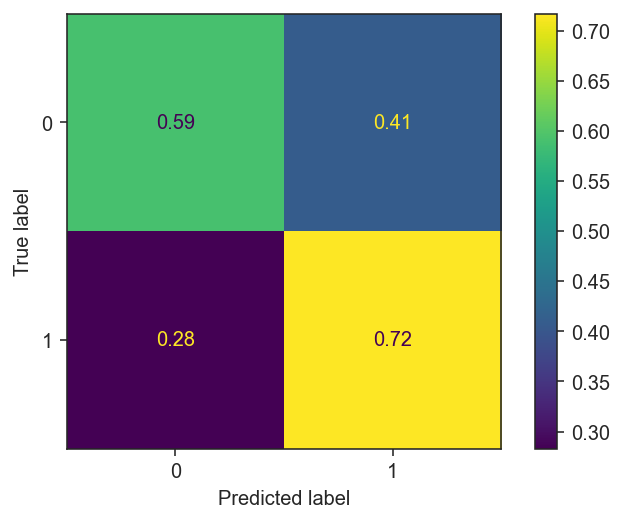

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,knn.predict(X_val_scale),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
from sklearn.metrics import accuracy_score

y_val_pred = knn.predict(X_val_scale)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.6606875934230194

### Sequential feature selection

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from mlxtend.feature_selection import SequentialFeatureSelector

# Create a StratifiedKFold cross-validation object
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize your Logistic Regression model
knn = KNeighborsClassifier()

# Initialize the Sequential Feature Selector
sfs = SequentialFeatureSelector(knn,
                                k_features='best',  # Select the best subset of features
                                forward=True,        # Forward selection (you can also try backward=False)
                                scoring='accuracy',  # Use accuracy as the evaluation metric
                                cv=kfold)

# Fit the SFS to your training data
sfs.fit(X_train_scale, y_train)

# Get the selected feature indices
selected_features_indices = np.array(sfs.k_feature_idx_)

# Get the names of the selected features
selected_feature_names = X_train_scale.columns[selected_features_indices]

# Select the features from your training data
X_train_selected = X_train_scale[selected_feature_names]

# Train your Logistic Regression model on the selected features
knn.fit(X_train_selected, y_train)

# Print the selected feature names
print("Selected feature names:", selected_feature_names)


Selected feature names: Index(['HS', 'AS', 'HST', 'AST', 'AF', 'HR', 'AR', 'AvgH', 'AvgD', 'AvgA',
       'MaxH', 'MaxD', 'MaxA', 'Prob_D', 'Days_D', 'MW', 'Year',
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff'],
      dtype='object')


In [ ]:
# evaluate the model on your validation or test set
X_val_selected = X_val_scale[selected_feature_names]
y_val_pred = knn.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.6905829596412556

### gridsearchCV

In [ ]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score


param_grid = {
    'n_neighbors': [2,5,8,10],
    'weights': ['uniform','distance'],

}


knn = KNeighborsClassifier()

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

scorer = make_scorer(f1_score, average='weighted')

grid_search = GridSearchCV(estimator=knn, param_grid=param_grid, scoring=scorer, cv=kfold, return_train_score=True)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

grid_search.fit(X_train_fold_resampled, y_train_fold_resampled)


best_estimator = grid_search.best_estimator_

In [ ]:
y_val_fold.value_counts()

NH    297
H     238
Name: WNW, dtype: int64

In [ ]:
y_train.value_counts()

NH    1481
H     1194
Name: WNW, dtype: int64

In [ ]:
y_train_fold_resampled.value_counts()

NH    1184
H     1184
Name: WNW, dtype: int64

In [ ]:
grid_search.best_score_

0.7465673042243363

In [ ]:
grid_search.best_params_

{'n_neighbors': 8, 'weights': 'distance'}

In [ ]:
knn_results = pd.DataFrame(grid_search.cv_results_).sort_values('rank_test_score')

In [ ]:
knn_results.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_n_neighbors', 'param_weights', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'split0_train_score', 'split1_train_score',
       'split2_train_score', 'split3_train_score', 'split4_train_score',
       'mean_train_score', 'std_train_score'],
      dtype='object')

In [ ]:
knn_results[['param_n_neighbors', 'param_weights','mean_train_score','mean_test_score','rank_test_score']]

,param_n_neighbors,param_weights,mean_train_score,mean_test_score,rank_test_score
5,8,distance,1.000000,0.746567,1
3,5,distance,1.000000,0.745405,2
7,10,distance,1.000000,0.742378,3
2,5,uniform,0.814731,0.725369,4
1,2,distance,1.000000,0.722636,5
4,8,uniform,0.783936,0.719948,6
6,10,uniform,0.771929,0.716512,7
0,2,uniform,0.833338,0.679813,8


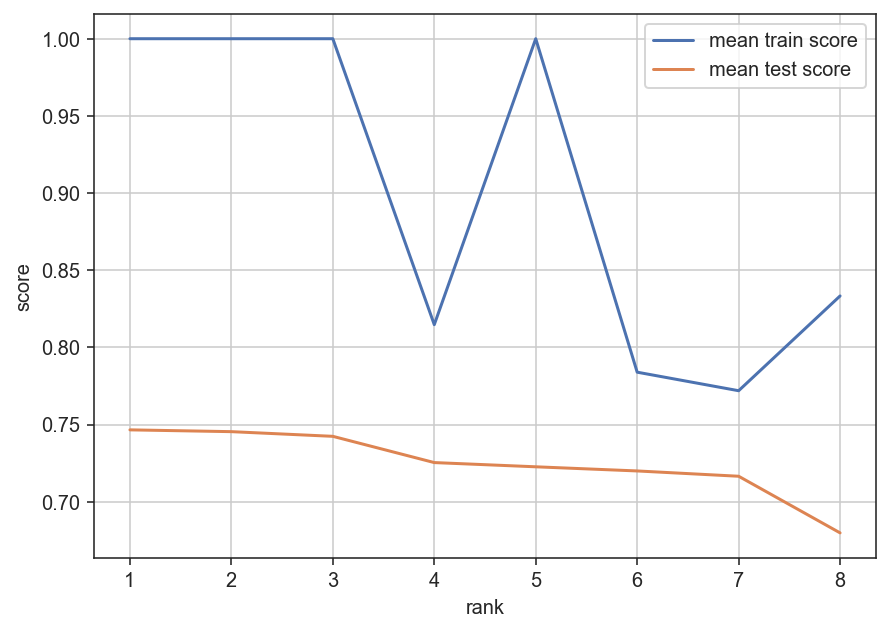

In [ ]:
fig,ax = plt.subplots(figsize=(7,5))
sns.lineplot(data=knn_results,x='rank_test_score',y='mean_train_score',ax=ax,errorbar=None)
sns.lineplot(data=knn_results,x='rank_test_score',y='mean_test_score',ax=ax,errorbar=None)
ax.legend(['mean train score','mean test score'])
ax.set_xlabel('rank')
ax.set_ylabel('score')
plt.grid(visible=True)

In [ ]:
winning_knn = grid_search.best_estimator_

In [ ]:
winning_knn

KNeighborsClassifier(n_neighbors=8, weights='distance')

In [ ]:
from sklearn.metrics import classification_report

y_pred_lg = winning_knn.predict(X_val_selected)
class_report_lg = classification_report(y_val, y_pred_lg)
print("\nClassification Report:")
print(class_report_lg)


Classification Report:
              precision    recall  f1-score   support

           H       0.63      0.66      0.65       298
          NH       0.72      0.69      0.71       371

    accuracy                           0.68       669
   macro avg       0.68      0.68      0.68       669
weighted avg       0.68      0.68      0.68       669



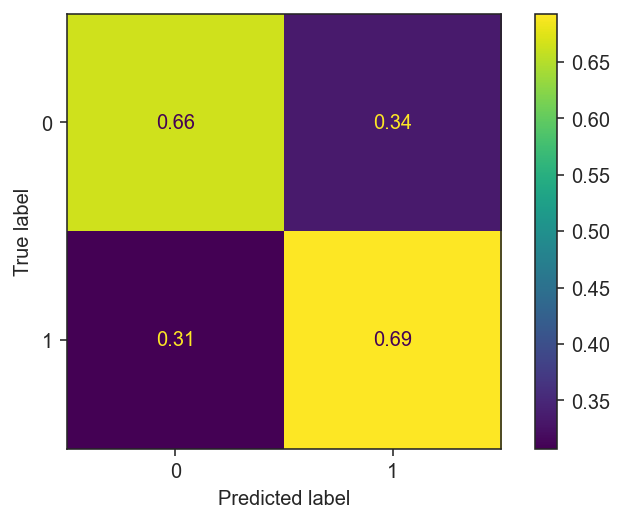

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,winning_knn.predict(X_val_selected),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
# evaluate the model on your validation or test set
X_val_selected = X_val_scale[selected_feature_names]
y_val_pred = winning_knn.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.680119581464873

In [ ]:
X_train_selected = X_train_scale[['HS', 'AS', 'HST', 'AST', 'AF', 'HR', 'AR', 'AvgH', 'AvgD', 'AvgA',\
       'MaxH', 'MaxD', 'MaxA', 'Prob_D', 'Days_D', 'MW', 'Year',\
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff']]

X_val_selected = X_val_scale[['HS', 'AS', 'HST', 'AST', 'AF', 'HR', 'AR', 'AvgH', 'AvgD', 'AvgA',\
       'MaxH', 'MaxD', 'MaxA', 'Prob_D', 'Days_D', 'MW', 'Year',\
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff']]

In [ ]:
knn = KNeighborsClassifier(n_neighbors = 10 , weights = 'uniform')

In [ ]:
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

knn.fit(X_train_fold_resampled, y_train_fold_resampled)

KNeighborsClassifier(n_neighbors=10)

In [ ]:
from sklearn.metrics import classification_report

y_pred_lg = knn.predict(X_val_selected)
class_report_knn = classification_report(y_val, y_pred_lg)
print("\nClassification Report:")
print(class_report_knn)


Classification Report:
              precision    recall  f1-score   support

           H       0.61      0.73      0.66       298
          NH       0.74      0.62      0.67       371

    accuracy                           0.67       669
   macro avg       0.67      0.67      0.67       669
weighted avg       0.68      0.67      0.67       669



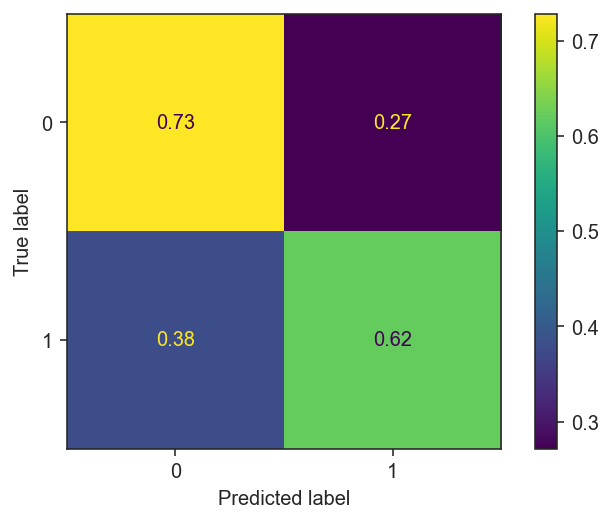

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,knn.predict(X_val_selected),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
# evaluate the model on your validation or test set
y_val_pred = knn.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.6681614349775785

## **SVM**

In [ ]:
from sklearn.svm import SVC
svc =SVC()

### scaling the data

In [ ]:
norm_cols=['MW', 'Year','Overall_diff', 'Attack_diff',\
       'Midfield_diff', 'Defence_diff']

In [ ]:
std_cols = [col for col in X_train.columns if col not in norm_cols]

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,Normalizer

In [ ]:
# Create transformers
stdscaling_transformer = StandardScaler()
normscaling_transformer = Normalizer()

# Create a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("std", stdscaling_transformer, std_cols),
        ("norm", normscaling_transformer, norm_cols)
    ],
    remainder='passthrough'
)

# Apply the transformations and convert back to a pandas DataFrame
X_train_scale = preprocessor.fit_transform(X_train)
X_train_scale = pd.DataFrame(X_train_scale, columns=std_cols + norm_cols)

In [ ]:
X_train_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,0.007046,0.549229,-0.009621,0.364080,0.725299,-1.375716,0.367912,-1.743391,1.207190,-1.369708,...,-0.136565,0.100487,-0.009676,0.017246,0.000993,0.999987,0.002483,0.002483,0.001986,0.002979
1,-0.348570,-0.880736,-0.714737,-0.036873,-1.348171,1.688199,-0.936050,0.119653,-0.438279,1.722248,...,0.782275,4.476563,-0.025650,-0.789449,0.003954,0.999990,-0.000989,-0.000989,0.000000,-0.001483
2,0.007046,-0.267894,-0.714737,-0.437826,0.132879,0.295510,1.019894,0.492261,1.207190,0.176270,...,-1.419827,-0.085729,0.553088,0.823941,0.015879,0.999865,0.002481,0.001985,0.001985,0.001985
3,-1.237611,-1.085017,-1.067295,-0.838778,-0.163331,-0.261565,-1.262041,0.492261,-0.438279,0.949259,...,1.323745,0.007379,0.101380,0.017246,0.003962,0.999987,-0.001486,0.000000,-0.002476,-0.000991
4,-0.881995,1.570633,-1.419853,1.165986,3.687399,0.295510,-1.262041,1.610088,1.207190,0.176270,...,-0.238686,10.528583,0.084392,-0.386102,0.004449,0.999983,-0.001977,-0.001977,-0.000989,-0.002472


In [ ]:
X_val_scale = preprocessor.fit_transform(X_val)
X_val_scale = pd.DataFrame(X_val_scale, columns=std_cols + norm_cols)

X_val_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-0.320599,-0.312972,0.685797,-0.896903,1.375084,0.608376,-0.550323,-0.677915,-0.429814,1.869933,...,0.025540,-1.524894,-0.176214,0.482873,0.014334,0.999893,-0.000989,-0.001977,-0.001483,-0.000989
1,1.411877,-0.518244,0.685797,0.348830,-0.736926,-0.550353,1.007063,-0.677915,0.389404,-0.532727,...,-0.795764,0.004445,0.520097,0.674722,0.017828,0.999841,0.000495,0.000000,0.000495,0.000000
2,0.545639,0.508119,0.017968,-0.066414,-1.340357,-0.550353,-0.550323,-0.321090,0.389404,0.268159,...,0.302770,-0.080518,-0.066477,-0.476373,0.005940,0.999925,0.004950,0.006435,0.005445,0.004455
3,-0.493846,-0.928789,-1.317689,-0.896903,-1.340357,-1.129717,0.072631,-0.677915,0.389404,1.069046,...,0.492413,-0.080518,-0.509134,-1.243770,0.011374,0.999923,-0.002473,-0.002473,-0.002967,-0.001978
4,-0.147351,-0.928789,-0.315946,-1.312147,-0.435210,-0.260671,2.564449,-0.677915,-1.249032,-0.532727,...,-2.544650,-0.080518,2.418901,1.825818,0.016862,0.999829,0.002976,0.005951,0.003472,0.000992


### Fitting simple model

In [ ]:
svc.fit(X_train_scale,y_train)

SVC()

In [ ]:
from sklearn.metrics import classification_report

y_pred_svc = svc.predict(X_val_scale)
class_report_svc = classification_report(y_val, y_pred_svc)
print("\nClassification Report:")
print(class_report_svc)


Classification Report:
              precision    recall  f1-score   support

           H       0.71      0.66      0.68       298
          NH       0.74      0.78      0.76       371

    accuracy                           0.73       669
   macro avg       0.73      0.72      0.72       669
weighted avg       0.73      0.73      0.73       669



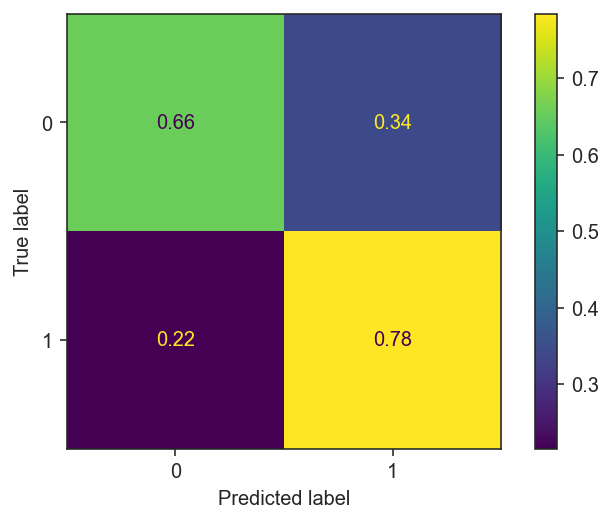

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,svc.predict(X_val_scale),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
from sklearn.metrics import accuracy_score

y_val_pred = svc.predict(X_val_scale)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7279521674140508

### Sequential feature selection

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from mlxtend.feature_selection import SequentialFeatureSelector

# Create a StratifiedKFold cross-validation object
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize your Logistic Regression model
svc =SVC()

# Initialize the Sequential Feature Selector
sfs = SequentialFeatureSelector(svc,
                                k_features='best',  # Select the best subset of features
                                forward=True,        # Forward selection (you can also try backward=False)
                                scoring='accuracy',  # Use accuracy as the evaluation metric
                                cv=kfold)

# Fit the SFS to your training data
sfs.fit(X_train_scale, y_train)

# Get the selected feature indices
selected_features_indices = np.array(sfs.k_feature_idx_)

# Get the names of the selected features
selected_feature_names = X_train_scale.columns[selected_features_indices]

# Select the features from your training data
X_train_selected = X_train_scale[selected_feature_names]

# Train your Logistic Regression model on the selected features
svc.fit(X_train_selected, y_train)

# Print the selected feature names
print("Selected feature names:", selected_feature_names)





Selected feature names: Index(['HS', 'AS', 'HST', 'AST', 'HC', 'AC', 'HY', 'HR', 'AR', 'AvgD', 'AvgA',
       'MaxH', 'MaxD', 'MaxA', 'Max>2.5', 'Avg<2.5', 'Prob_D', 'Days_D',
       'SP_diff', 'MW', 'Overall_diff', 'Attack_diff', 'Midfield_diff',
       'Defence_diff'],
      dtype='object')


In [ ]:
# evaluate the model on your validation or test set
X_val_selected = X_val_scale[selected_feature_names]
y_val_pred = svc.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.71898355754858

### gridsearchCV

In [ ]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score


param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],          # Regularization parameter
    'kernel': ['linear', 'rbf', 'poly'],    # Kernel type: linear, radial basis function (RBF), polynomial
    'degree': [2, 3, 4],                   # Degree for polynomial kernel (if used)
    'gamma': ['scale', 'auto'] + [0.001, 0.01, 0.1, 1],  # Kernel coefficient (gamma), 'scale', 'auto', or specific values
    'class_weight': ['balanced', None],     # Class weight: balanced or None
}


svc = SVC()

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

scorer = make_scorer(f1_score, average='weighted')

grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, scoring=scorer, cv=kfold,return_train_score=True)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

grid_search.fit(X_train_fold_resampled, y_train_fold_resampled)


best_estimator = grid_search.best_estimator_

In [ ]:
y_val_fold.value_counts()

NH    297
H     238
Name: WNW, dtype: int64

In [ ]:
y_train.value_counts()

NH    1481
H     1194
Name: WNW, dtype: int64

In [ ]:
y_train_fold_resampled.value_counts()

NH    1184
H     1184
Name: WNW, dtype: int64

In [ ]:
grid_search.best_score_

0.7557390675528494

In [ ]:
grid_search.best_params_

{'C': 1,
 'class_weight': None,
 'degree': 2,
 'gamma': 'scale',
 'kernel': 'linear'}

In [ ]:
svc_results = pd.DataFrame(grid_search.cv_results_).sort_values('rank_test_score')

In [ ]:
svc_results.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'param_class_weight', 'param_degree', 'param_gamma',
       'param_kernel', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'split4_test_score',
       'mean_test_score', 'std_test_score', 'rank_test_score',
       'split0_train_score', 'split1_train_score', 'split2_train_score',
       'split3_train_score', 'split4_train_score', 'mean_train_score',
       'std_train_score'],
      dtype='object')

In [ ]:
svc_results[['param_C', 'param_class_weight', 'param_degree', 'param_gamma','param_kernel','mean_train_score','mean_test_score','rank_test_score']]

,param_C,param_class_weight,param_degree,param_gamma,param_kernel,mean_train_score,mean_test_score,rank_test_score
396,1,None,3,scale,linear,0.761176,0.755739,1
414,1,None,4,scale,linear,0.761176,0.755739,1
417,1,None,4,auto,linear,0.761176,0.755739,1
420,1,None,4,0.001,linear,0.761176,0.755739,1
393,1,None,2,1,linear,0.761176,0.755739,1
...,...,...,...,...,...,...,...,...
44,0.001,balanced,4,0.001,poly,0.334622,0.333798,521
368,1,balanced,4,0.001,poly,0.334622,0.333798,521
296,0.1,None,3,0.001,poly,0.334622,0.333798,521
83,0.001,None,3,0.01,poly,0.334622,0.333798,521


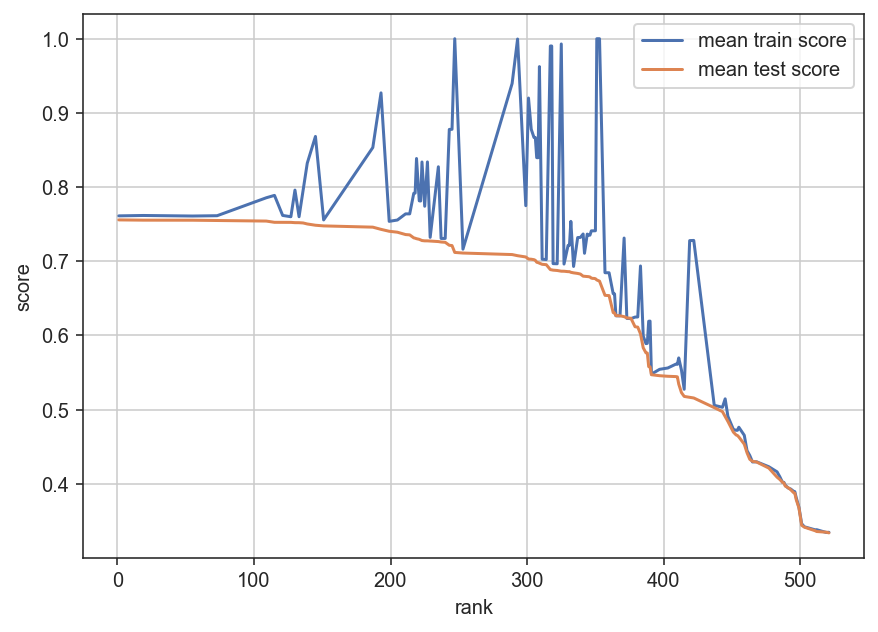

In [ ]:
fig,ax = plt.subplots(figsize=(7,5))
sns.lineplot(data=svc_results,x='rank_test_score',y='mean_train_score',ax=ax,errorbar=None)
sns.lineplot(data=svc_results,x='rank_test_score',y='mean_test_score',ax=ax,errorbar=None)
ax.legend(['mean train score','mean test score'])
ax.set_xlabel('rank')
ax.set_ylabel('score')
plt.grid(visible=True)

In [ ]:
winning_svc = grid_search.best_estimator_

In [ ]:
winning_svc

SVC(C=1, degree=2, kernel='linear')

In [ ]:
from sklearn.metrics import classification_report

y_pred_svc = winning_svc.predict(X_val_selected)
class_report_svc = classification_report(y_val, y_pred_svc)
print("\nClassification Report:")
print(class_report_svc)


Classification Report:
              precision    recall  f1-score   support

           H       0.70      0.73      0.72       298
          NH       0.78      0.75      0.77       371

    accuracy                           0.74       669
   macro avg       0.74      0.74      0.74       669
weighted avg       0.75      0.74      0.74       669



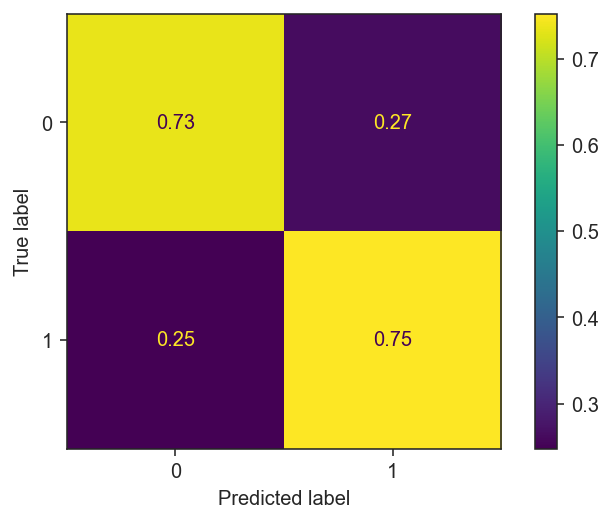

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,winning_svc.predict(X_val_selected),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
# evaluate the model on your validation or test set
X_val_selected = X_val_scale[selected_feature_names]
y_val_pred = winning_svc.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7443946188340808

In [ ]:
# svc_results['diff']=abs(svc_results['mean_train_score']-svc_results['mean_test_score'])

# sorted_table = svc_results[['param_C', 'param_class_weight', 'param_degree', 'param_gamma','param_kernel',\
#                             'mean_train_score','mean_test_score','diff','rank_test_score']]\
#                             .sort_values(by=['diff', 'mean_test_score'], ascending=[True, False])
# sorted_table

In [ ]:
# sorted_table.loc[sorted_table['mean_test_score'] > 0.50].sort_values(by=['diff', 'mean_test_score'], ascending=[True, False])

In [ ]:
# param_svc = sorted_table.loc[(sorted_table['mean_test_score'] > 0.50) & (sorted_table['rank_test_score'] < 200)]\
# .sort_values(by=['diff', 'mean_test_score'], ascending=[True, False])

# param_svc

In [ ]:
# param_svc.iloc[0]

In [ ]:
# svc = SVC(C =0.1, class_weight = None, degree = 2, gamma = 'scale', kernel = 'linear')

In [ ]:
# svc.fit(X_train_selected,y_train)

In [ ]:
# from sklearn.metrics import classification_report

# y_pred_svc = svc.predict(X_val_selected)
# class_report_svc = classification_report(y_val, y_pred_svc)
# print("\nClassification Report:")
# print(class_report_svc)

In [ ]:
# from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
# cm=confusion_matrix(y_val,svc.predict(X_val_selected),normalize='true')
# ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
# # evaluate the model on your validation or test set
# X_val_selected = X_val_scale[selected_feature_names]
# y_val_pred = svc.predict(X_val_selected)
# val_accuracy = accuracy_score(y_val, y_val_pred)
# val_accuracy

## **GNB**

In [ ]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()

### Fitting simple model

In [ ]:
nb.fit(X_train,y_train)

GaussianNB()

In [ ]:
from sklearn.metrics import classification_report

y_pred_nb = nb.predict(X_val)
class_report_nb = classification_report(y_val, y_pred_nb)
print("\nClassification Report:")
print(class_report_nb)


Classification Report:
              precision    recall  f1-score   support

           H       0.67      0.54      0.60       298
          NH       0.68      0.79      0.73       371

    accuracy                           0.68       669
   macro avg       0.68      0.66      0.66       669
weighted avg       0.68      0.68      0.67       669



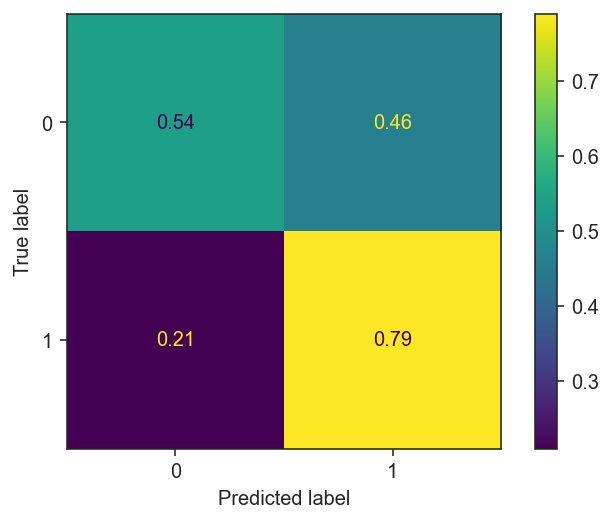

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,nb.predict(X_val),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
from sklearn.metrics import accuracy_score

y_val_pred = nb.predict(X_val)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.6771300448430493

### Sequential feature selection

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from mlxtend.feature_selection import SequentialFeatureSelector

# Create a StratifiedKFold cross-validation object
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize your Logistic Regression model
nb = GaussianNB()

# Initialize the Sequential Feature Selector
sfs = SequentialFeatureSelector(nb,
                                k_features='best',  # Select the best subset of features
                                forward=True,        # Forward selection (you can also try backward=False)
                                scoring='accuracy',  # Use accuracy as the evaluation metric
                                cv=kfold)

# Fit the SFS to your training data
sfs.fit(X_train, y_train)

# Get the selected feature indices
selected_features_indices = np.array(sfs.k_feature_idx_)

# Get the names of the selected features
selected_feature_names = X_train.columns[selected_features_indices]

# Select the features from your training data
X_train_selected = X_train[selected_feature_names]

# Train your Logistic Regression model on the selected features
nb.fit(X_train_selected, y_train)

# Print the selected feature names
print("Selected feature names:", selected_feature_names)





Selected feature names: Index(['HST', 'AST', 'AF', 'HY', 'Year', 'Avg>2.5', 'TGD', 'Overall_diff'], dtype='object')


In [ ]:
# evaluate the model on your validation or test set
X_val_selected = X_val[selected_feature_names]
y_val_pred = nb.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.6980568011958147

### gridsearchCV

In [ ]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score


param_grid = {
   'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5],  # Smoothing parameter for avoiding zero probabilities

}



nb = GaussianNB()

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_selected, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_selected.iloc[train_idx], X_train_selected.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

scorer = make_scorer(f1_score, average='weighted')

grid_search = GridSearchCV(estimator=nb, param_grid=param_grid, scoring=scorer, cv=kfold,return_train_score=True)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

grid_search.fit(X_train_fold_resampled, y_train_fold_resampled)


best_estimator = grid_search.best_estimator_

In [ ]:
y_val_fold.value_counts()

NH    297
H     238
Name: WNW, dtype: int64

In [ ]:
y_train.value_counts()

NH    1481
H     1194
Name: WNW, dtype: int64

In [ ]:
y_train_fold_resampled.value_counts()

NH    1184
H     1184
Name: WNW, dtype: int64

In [ ]:
grid_search.best_score_

0.7126380918097064

In [ ]:
grid_search.best_params_

{'var_smoothing': 1e-05}

In [ ]:
nb_results = pd.DataFrame(grid_search.cv_results_).sort_values('rank_test_score')

In [ ]:
nb_results.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_var_smoothing', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'split0_train_score', 'split1_train_score',
       'split2_train_score', 'split3_train_score', 'split4_train_score',
       'mean_train_score', 'std_train_score'],
      dtype='object')

In [ ]:
nb_results[['param_var_smoothing', 'mean_train_score','mean_test_score','rank_test_score']]

,param_var_smoothing,mean_train_score,mean_test_score,rank_test_score
4,0.00001,0.711773,0.712638,1
3,0.000001,0.712082,0.712184,2
0,0.0,0.712185,0.711746,3
1,0.0,0.712185,0.711746,3
2,0.0,0.712185,0.711746,3


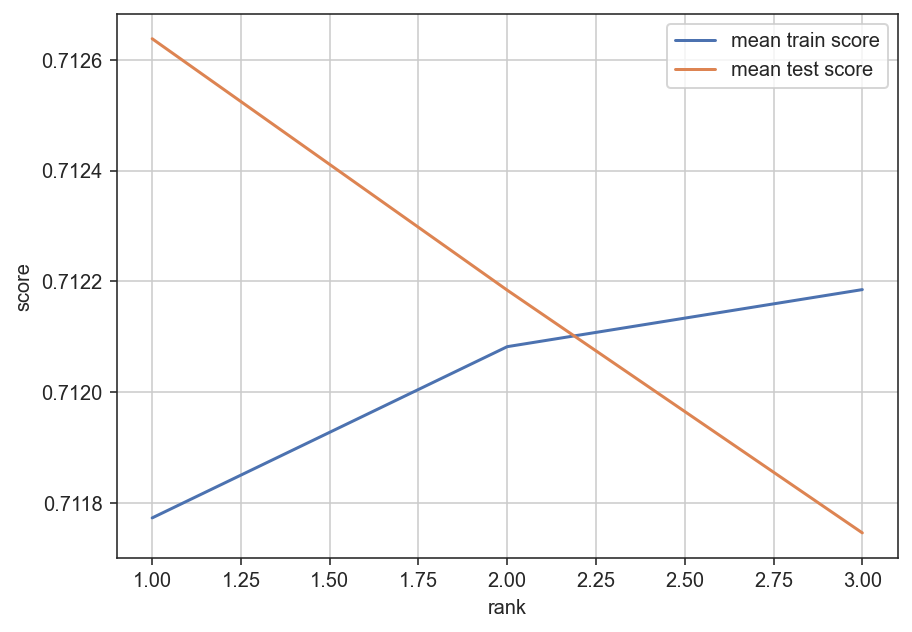

In [ ]:
fig,ax = plt.subplots(figsize=(7,5))
sns.lineplot(data=nb_results,x='rank_test_score',y='mean_train_score',ax=ax,errorbar=None)
sns.lineplot(data=nb_results,x='rank_test_score',y='mean_test_score',ax=ax,errorbar=None)
ax.legend(['mean train score','mean test score'])
ax.set_xlabel('rank')
ax.set_ylabel('score')
plt.grid(visible=True)

In [ ]:
winning_nb = grid_search.best_estimator_

In [ ]:
winning_nb

GaussianNB(var_smoothing=1e-05)

In [ ]:
from sklearn.metrics import classification_report

y_pred_nb = winning_nb.predict(X_val_selected)
class_report_nb = classification_report(y_val, y_pred_nb)
print("\nClassification Report:")
print(class_report_nb)


Classification Report:
              precision    recall  f1-score   support

           H       0.66      0.64      0.65       298
          NH       0.72      0.73      0.72       371

    accuracy                           0.69       669
   macro avg       0.69      0.69      0.69       669
weighted avg       0.69      0.69      0.69       669



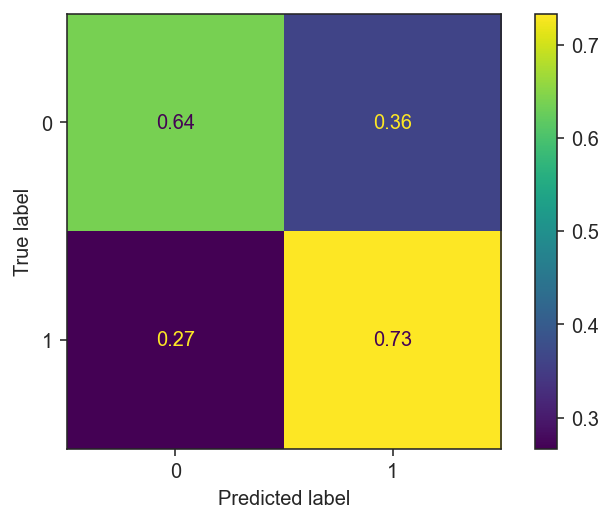

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,winning_nb.predict(X_val_selected),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
# evaluate the model on your validation or test set
X_val_selected = X_val[selected_feature_names]
y_val_pred = winning_nb.predict(X_val_selected)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.6905829596412556

## MLP

In [ ]:
from sklearn.neural_network import MLPClassifier


### scaling the data

In [ ]:
norm_cols=['MW', 'Year','Overall_diff', 'Attack_diff',\
       'Midfield_diff', 'Defence_diff']

In [ ]:
std_cols = [col for col in X_train.columns if col not in norm_cols]

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,Normalizer

In [ ]:
# Create transformers
stdscaling_transformer = StandardScaler()
normscaling_transformer = Normalizer()

# Create a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("std", stdscaling_transformer, std_cols),
        ("norm", normscaling_transformer, norm_cols)
    ],
    remainder='passthrough'
)

# Apply the transformations and convert back to a pandas DataFrame
X_train_scale = preprocessor.fit_transform(X_train)
X_train_scale = pd.DataFrame(X_train_scale, columns=std_cols + norm_cols)

In [ ]:
X_train_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,0.007046,0.549229,-0.009621,0.364080,0.725299,-1.375716,0.367912,-1.743391,1.207190,-1.369708,...,-0.136565,0.100487,-0.009676,0.017246,0.000993,0.999987,0.002483,0.002483,0.001986,0.002979
1,-0.348570,-0.880736,-0.714737,-0.036873,-1.348171,1.688199,-0.936050,0.119653,-0.438279,1.722248,...,0.782275,4.476563,-0.025650,-0.789449,0.003954,0.999990,-0.000989,-0.000989,0.000000,-0.001483
2,0.007046,-0.267894,-0.714737,-0.437826,0.132879,0.295510,1.019894,0.492261,1.207190,0.176270,...,-1.419827,-0.085729,0.553088,0.823941,0.015879,0.999865,0.002481,0.001985,0.001985,0.001985
3,-1.237611,-1.085017,-1.067295,-0.838778,-0.163331,-0.261565,-1.262041,0.492261,-0.438279,0.949259,...,1.323745,0.007379,0.101380,0.017246,0.003962,0.999987,-0.001486,0.000000,-0.002476,-0.000991
4,-0.881995,1.570633,-1.419853,1.165986,3.687399,0.295510,-1.262041,1.610088,1.207190,0.176270,...,-0.238686,10.528583,0.084392,-0.386102,0.004449,0.999983,-0.001977,-0.001977,-0.000989,-0.002472


In [ ]:
X_val_scale = preprocessor.fit_transform(X_val)
X_val_scale = pd.DataFrame(X_val_scale, columns=std_cols + norm_cols)

X_val_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-0.320599,-0.312972,0.685797,-0.896903,1.375084,0.608376,-0.550323,-0.677915,-0.429814,1.869933,...,0.025540,-1.524894,-0.176214,0.482873,0.014334,0.999893,-0.000989,-0.001977,-0.001483,-0.000989
1,1.411877,-0.518244,0.685797,0.348830,-0.736926,-0.550353,1.007063,-0.677915,0.389404,-0.532727,...,-0.795764,0.004445,0.520097,0.674722,0.017828,0.999841,0.000495,0.000000,0.000495,0.000000
2,0.545639,0.508119,0.017968,-0.066414,-1.340357,-0.550353,-0.550323,-0.321090,0.389404,0.268159,...,0.302770,-0.080518,-0.066477,-0.476373,0.005940,0.999925,0.004950,0.006435,0.005445,0.004455
3,-0.493846,-0.928789,-1.317689,-0.896903,-1.340357,-1.129717,0.072631,-0.677915,0.389404,1.069046,...,0.492413,-0.080518,-0.509134,-1.243770,0.011374,0.999923,-0.002473,-0.002473,-0.002967,-0.001978
4,-0.147351,-0.928789,-0.315946,-1.312147,-0.435210,-0.260671,2.564449,-0.677915,-1.249032,-0.532727,...,-2.544650,-0.080518,2.418901,1.825818,0.016862,0.999829,0.002976,0.005951,0.003472,0.000992


### Fitting simple model

In [ ]:
mlp = MLPClassifier(max_iter=1500)
mlp.fit(X_train_scale,y_train)

MLPClassifier(max_iter=1500)

In [ ]:
from sklearn.metrics import classification_report

y_pred_mlp = mlp.predict(X_val_scale)
class_report_mlp = classification_report(y_val, y_pred_mlp)
print("\nClassification Report:")
print(class_report_mlp)


Classification Report:
              precision    recall  f1-score   support

           H       0.64      0.64      0.64       298
          NH       0.71      0.72      0.71       371

    accuracy                           0.68       669
   macro avg       0.68      0.68      0.68       669
weighted avg       0.68      0.68      0.68       669



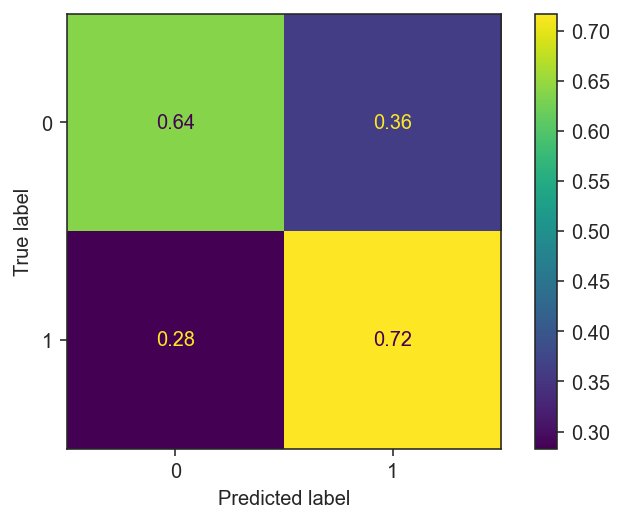

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,mlp.predict(X_val_scale),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
from sklearn.metrics import accuracy_score

y_val_pred = mlp.predict(X_val_scale)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.6816143497757847

### gridsearchCV

In [ ]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.neural_network import MLPClassifier
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score


param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (150,)],  # Number of neurons in each hidden layer
    'activation': ['relu', 'tanh', 'logistic','identity'],       # Activation functions for hidden layers
    'solver': ['adam', 'lbfgs'],                     # Optimization algorithm
    'alpha': [0.0001, 0.001, 0.01],                 # L2 regularization term
    'learning_rate': ['constant', 'invscaling', 'adaptive'],  # Learning rate schedule
    'max_iter': [2000, 3000],                     # Maximum number of iterations
    'early_stopping' : [True]
}



mlp = MLPClassifier()

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store cross-validation results
cv_scores = []

# Iterate over the cross-validation folds
for train_idx, val_idx in kfold.split(X_train_scale, y_train):
    # Split the training data into training and validation sets for the fold
    X_train_fold, X_val_fold = X_train_scale.iloc[train_idx], X_train_scale.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]


smote = SMOTE(sampling_strategy='auto', random_state=42)

scorer = make_scorer(f1_score, average='weighted')

grid_search = GridSearchCV(estimator=mlp, param_grid=param_grid, scoring=scorer, cv=kfold,return_train_score=True)

X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)

grid_search.fit(X_train_fold_resampled, y_train_fold_resampled)


best_estimator = grid_search.best_estimator_

C:\Users\22547960\AppData\Roaming\Python\Python37\site-packages\sklearn\base.py:451: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  "X does not have valid feature names, but"
C:\Users\22547960\AppData\Roaming\Python\Python37\site-packages\sklearn\base.py:451: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  "X does not have valid feature names, but"
C:\Users\22547960\AppData\Roaming\Python\Python37\site-packages\sklearn\base.py:451: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  "X does not have valid feature names, but"
C:\Users\22547960\AppData\Roaming\Python\Python37\site-packages\sklearn\base.py:451: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  "X does not have valid feature names, but"
C:\Users\22547960\AppData\Roaming\Python\Python37\site-packages\sklearn\base.py:451: Use

In [ ]:
y_val_fold.value_counts()

NH    297
H     238
Name: WNW, dtype: int64

In [ ]:
y_train.value_counts()

NH    1481
H     1194
Name: WNW, dtype: int64

In [ ]:
y_train_fold_resampled.value_counts()

NH    1184
H     1184
Name: WNW, dtype: int64

In [ ]:
grid_search.best_score_

0.7549472565300407

In [ ]:
grid_search.best_params_

{'activation': 'relu',
 'alpha': 0.001,
 'early_stopping': True,
 'hidden_layer_sizes': (150,),
 'learning_rate': 'invscaling',
 'max_iter': 3000,
 'solver': 'adam'}

In [ ]:
mlp_results = pd.DataFrame(grid_search.cv_results_).sort_values('rank_test_score')

In [ ]:
mlp_results.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_activation', 'param_alpha', 'param_early_stopping',
       'param_hidden_layer_sizes', 'param_learning_rate', 'param_max_iter',
       'param_solver', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'split4_test_score',
       'mean_test_score', 'std_test_score', 'rank_test_score',
       'split0_train_score', 'split1_train_score', 'split2_train_score',
       'split3_train_score', 'split4_train_score', 'mean_train_score',
       'std_train_score'],
      dtype='object')

In [ ]:
mlp_results[['param_hidden_layer_sizes', 'param_activation', 'param_solver', 'param_alpha', 'param_learning_rate', \
                 'param_max_iter','mean_train_score','mean_test_score','rank_test_score']]

,param_hidden_layer_sizes,param_activation,param_solver,param_alpha,param_learning_rate,param_max_iter,mean_train_score,mean_test_score,rank_test_score
66,"(150,)",relu,adam,0.001,invscaling,3000,0.794436,0.754947,1
68,"(150,)",relu,adam,0.001,adaptive,2000,0.784832,0.753714,2
126,"(100,)",tanh,adam,0.0001,invscaling,3000,0.762433,0.753707,3
24,"(150,)",relu,adam,0.0001,constant,2000,0.780303,0.752212,4
414,"(100,)",identity,adam,0.01,invscaling,3000,0.751657,0.752037,5
...,...,...,...,...,...,...,...,...,...
263,"(50,)",logistic,lbfgs,0.001,adaptive,3000,1.000000,0.700969,428
113,"(50,)",tanh,lbfgs,0.0001,invscaling,2000,1.000000,0.700245,429
41,"(50,)",relu,lbfgs,0.001,invscaling,2000,1.000000,0.699905,430
216,"(50,)",logistic,adam,0.0001,constant,2000,0.710984,0.698406,431


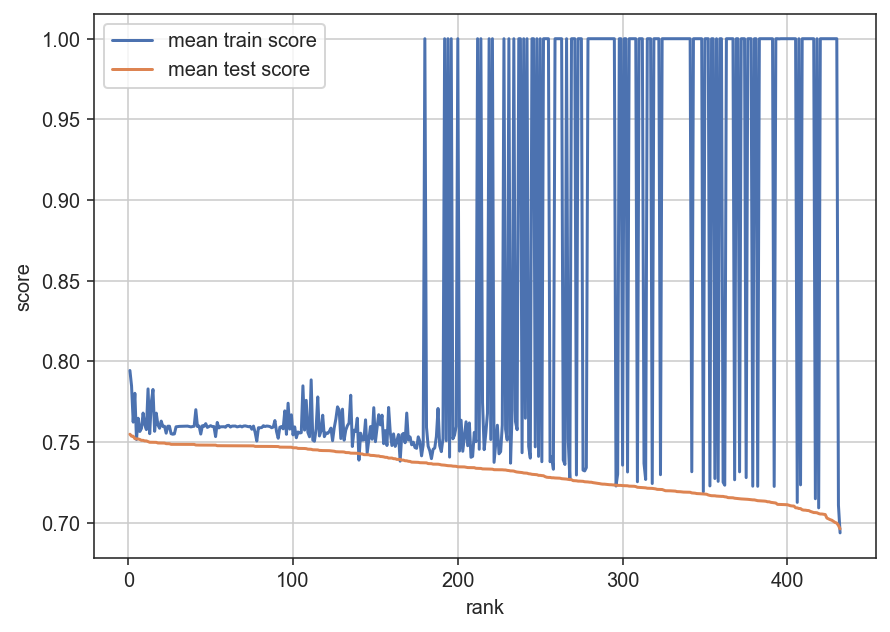

In [ ]:
fig,ax = plt.subplots(figsize=(7,5))
sns.lineplot(data=mlp_results,x='rank_test_score',y='mean_train_score',ax=ax,errorbar=None)
sns.lineplot(data=mlp_results,x='rank_test_score',y='mean_test_score',ax=ax,errorbar=None)
ax.legend(['mean train score','mean test score'])
ax.set_xlabel('rank')
ax.set_ylabel('score')
plt.grid(visible=True)

In [ ]:
winning_mlp = grid_search.best_estimator_

In [ ]:
winning_mlp

MLPClassifier(alpha=0.001, early_stopping=True, hidden_layer_sizes=(150,),
              learning_rate='invscaling', max_iter=3000)

In [ ]:
from sklearn.metrics import classification_report

y_pred_mlp = winning_mlp.predict(X_val_scale)
class_report_mlp = classification_report(y_val, y_pred_mlp)
print("\nClassification Report:")
print(class_report_mlp)


Classification Report:
              precision    recall  f1-score   support

           H       0.69      0.74      0.71       298
          NH       0.78      0.74      0.76       371

    accuracy                           0.74       669
   macro avg       0.73      0.74      0.74       669
weighted avg       0.74      0.74      0.74       669



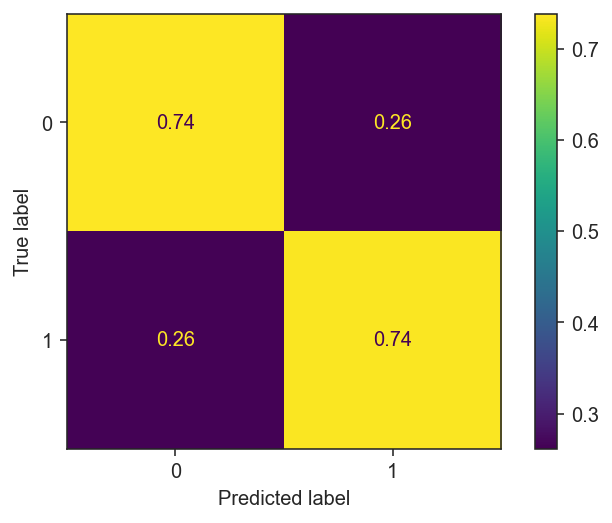

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val,winning_mlp.predict(X_val_scale),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [ ]:
# evaluate the model on your validation or test set

y_val_pred = winning_mlp.predict(X_val_scale)
val_accuracy = accuracy_score(y_val, y_val_pred)
val_accuracy

0.7369207772795217

In [ ]:
!pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flake8 3.9.0 requires pycodestyle<2.8.0,>=2.7.0, but you have pycodestyle 2.6.0 which is incompatible.
flake8 3.9.0 requires pyflakes<2.4.0,>=2.3.0, but you have pyflakes 2.2.0 which is incompatible.


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
len(pl.columns)

36

In [ ]:
pl.columns

Index(['HS', 'AS', 'HST', 'AST', 'HF', 'AF', 'HC', 'AC', 'HY', 'AY', 'HR',
       'AR', 'AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA', 'MW', 'Year',
       'Max>2.5', 'Max<2.5', 'Avg>2.5', 'Avg<2.5', 'TGD', 'Prob_D',
       'Elo_Before_Home', 'Elo_Before_Away', 'Days_D', 'form_diff', 'SP_diff',
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff', 'WNW'],
      dtype='object')

## **CNN**

### **Train_test_splitting the data**

In [ ]:
from sklearn.model_selection import train_test_split


X = pl.drop(columns=['WNW'])
y = pl['WNW']

# Split the data into training, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2, random_state=42)

In [ ]:
 len(X.columns)

35

### **scaling the data**

In [ ]:
norm_cols=['MW', 'Year','Overall_diff', 'Attack_diff',\
       'Midfield_diff', 'Defence_diff']

In [ ]:
std_cols = [col for col in X_train.columns if col not in norm_cols]

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,Normalizer

In [ ]:
# Create transformers
stdscaling_transformer = StandardScaler()
normscaling_transformer = Normalizer()

# Create a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ("std", stdscaling_transformer, std_cols),
        ("norm", normscaling_transformer, norm_cols)
    ],
    remainder='passthrough'
)

# Apply the transformations and convert back to a pandas DataFrame
X_train_scale = preprocessor.fit_transform(X_train)
X_train_scale = pd.DataFrame(X_train_scale, columns=std_cols + norm_cols)

In [ ]:
X_train_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,0.007046,0.549229,-0.009621,0.364080,0.725299,-1.375716,0.367912,-1.743391,1.207190,-1.369708,...,-0.136565,0.100487,-0.009676,0.017246,0.000993,0.999987,0.002483,0.002483,0.001986,0.002979
1,-0.348570,-0.880736,-0.714737,-0.036873,-1.348171,1.688199,-0.936050,0.119653,-0.438279,1.722248,...,0.782275,4.476563,-0.025650,-0.789449,0.003954,0.999990,-0.000989,-0.000989,0.000000,-0.001483
2,0.007046,-0.267894,-0.714737,-0.437826,0.132879,0.295510,1.019894,0.492261,1.207190,0.176270,...,-1.419827,-0.085729,0.553088,0.823941,0.015879,0.999865,0.002481,0.001985,0.001985,0.001985
3,-1.237611,-1.085017,-1.067295,-0.838778,-0.163331,-0.261565,-1.262041,0.492261,-0.438279,0.949259,...,1.323745,0.007379,0.101380,0.017246,0.003962,0.999987,-0.001486,0.000000,-0.002476,-0.000991
4,-0.881995,1.570633,-1.419853,1.165986,3.687399,0.295510,-1.262041,1.610088,1.207190,0.176270,...,-0.238686,10.528583,0.084392,-0.386102,0.004449,0.999983,-0.001977,-0.001977,-0.000989,-0.002472


In [ ]:
X_val_scale = preprocessor.fit_transform(X_val)
X_val_scale = pd.DataFrame(X_val_scale, columns=std_cols + norm_cols)

X_val_scale.head(5)

,HS,AS,HST,AST,HF,AF,HC,AC,HY,AY,...,Elo_Before_Away,Days_D,form_diff,SP_diff,MW,Year,Overall_diff,Attack_diff,Midfield_diff,Defence_diff
0,-0.320599,-0.312972,0.685797,-0.896903,1.375084,0.608376,-0.550323,-0.677915,-0.429814,1.869933,...,0.025540,-1.524894,-0.176214,0.482873,0.014334,0.999893,-0.000989,-0.001977,-0.001483,-0.000989
1,1.411877,-0.518244,0.685797,0.348830,-0.736926,-0.550353,1.007063,-0.677915,0.389404,-0.532727,...,-0.795764,0.004445,0.520097,0.674722,0.017828,0.999841,0.000495,0.000000,0.000495,0.000000
2,0.545639,0.508119,0.017968,-0.066414,-1.340357,-0.550353,-0.550323,-0.321090,0.389404,0.268159,...,0.302770,-0.080518,-0.066477,-0.476373,0.005940,0.999925,0.004950,0.006435,0.005445,0.004455
3,-0.493846,-0.928789,-1.317689,-0.896903,-1.340357,-1.129717,0.072631,-0.677915,0.389404,1.069046,...,0.492413,-0.080518,-0.509134,-1.243770,0.011374,0.999923,-0.002473,-0.002473,-0.002967,-0.001978
4,-0.147351,-0.928789,-0.315946,-1.312147,-0.435210,-0.260671,2.564449,-0.677915,-1.249032,-0.532727,...,-2.544650,-0.080518,2.418901,1.825818,0.016862,0.999829,0.002976,0.005951,0.003472,0.000992


### **fitting the model**

In [ ]:
num_classes = 2

In [ ]:
from sklearn.preprocessing import LabelEncoder
# Convert categorical target variables to integer labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)

# Get the number of classes in the target variable
num_classes = len(label_encoder.classes_)

In [ ]:
from keras.callbacks import Callback

class LossCallback(Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f"\nEpoch {epoch+1}/{self.params['epochs']} - ")

In [ ]:
X_train_scale.columns

Index(['HS', 'AS', 'HST', 'AST', 'HF', 'AF', 'HC', 'AC', 'HY', 'AY', 'HR',
       'AR', 'AvgH', 'AvgD', 'AvgA', 'MaxH', 'MaxD', 'MaxA', 'Max>2.5',
       'Max<2.5', 'Avg>2.5', 'Avg<2.5', 'TGD', 'Prob_D', 'Elo_Before_Home',
       'Elo_Before_Away', 'Days_D', 'form_diff', 'SP_diff', 'MW', 'Year',
       'Overall_diff', 'Attack_diff', 'Midfield_diff', 'Defence_diff'],
      dtype='object')

In [ ]:
X_train_cnn = np.expand_dims(X_train_scale, axis=-1)
X_val_cnn = np.expand_dims(X_val_scale, axis=-1)

In [ ]:
from keras.regularizers import l2
from keras.optimizers import Adam
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from sklearn.metrics import  make_scorer,f1_score,precision_score,recall_score

#  learning rate
custom_learning_rate = 0.001

# Initialize lists to store cross-validation results
cv_scores = []

# Define the number of splits for StratifiedKFold
n_splits = 5

# Create an instance of the custom callback
loss_callback = LossCallback()

# Initialize StratifiedKFold with SMOTE
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=42)

# Iterate over the cross-validation folds
for train_idx, val_idx in skf.split(X_train_cnn, y_train_encoded):
    X_train_fold, X_val_fold = X_train_cnn[train_idx], X_train_cnn[val_idx]
    y_train_fold, y_val_fold = y_train_encoded[train_idx], y_train_encoded[val_idx]

    # Apply SMOTE to the training fold
    X_train_fold_reshaped = X_train_fold.reshape(X_train_fold.shape[0], -1)  # Flatten the 3D input data
    X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold_reshaped, y_train_fold)
    X_train_fold_resampled = X_train_fold_resampled.reshape(X_train_fold_resampled.shape[0], X_train_fold.shape[1], 1)  # Reshape back to 3D

    # Create and compile the model inside the loop (if you want to start fresh for each fold)
    model = keras.Sequential([
    # 1D convolutional layer with 32 filters and kernel size of 3
        layers.Conv1D(64, kernel_size=3, strides=2, activation='relu', input_shape=(X_train.shape[1], 1)),
    # MaxPooling layer to downsample the data
        # layers.MaxPooling1D(pool_size=2),
        layers.AveragePooling1D(pool_size=2),
    # Dropout layer with a specified dropout rate
        layers.Dropout(0.1),
    # Flatten the data to prepare for the fully connected layers
        layers.Flatten(),
    # fully connected (dense) layer with 64 neurons, ReLU activation, and L2 regularization
        layers.Dense(64, activation='relu', kernel_regularizer=l2(0.01)),  # Adjust the L2 regularization strength as needed
    # Dropout layer
        layers.Dropout(0.5),
    # output layer with the number of classes and softmax activation
        layers.Dense(num_classes, activation='softmax')

    ])

    # Use the Adam optimizer with the custom learning rate
    custom_optimizer = Adam(learning_rate=custom_learning_rate)

    model.compile(optimizer = custom_optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Train the model for a fixed number of epochs
    history = model.fit(X_train_fold_resampled, y_train_fold_resampled, epochs=50, batch_size=64,
                        validation_data=(X_val_fold, y_val_fold),
                        callbacks=[loss_callback])

    # Training the model in the training set
    train_loss, train_acc = model.evaluate(X_val_fold, y_val_fold)



Epoch 1/50
24/38 [=================>............] - ETA: 0s - loss: 1.5374 - accuracy: 0.6322 
Epoch 1/50 - 
38/38 [==============================] - 1s 9ms/step - loss: 1.4030 - accuracy: 0.6603 - val_loss: 1.0356 - val_accuracy: 0.7178
Epoch 2/50
25/38 [==================>...........] - ETA: 0s - loss: 0.9366 - accuracy: 0.7013
Epoch 2/50 - 
38/38 [==============================] - 0s 3ms/step - loss: 0.9051 - accuracy: 0.7017 - val_loss: 0.7660 - val_accuracy: 0.7215
Epoch 3/50
25/38 [==================>...........] - ETA: 0s - loss: 0.7555 - accuracy: 0.6938
Epoch 3/50 - 
38/38 [==============================] - 0s 3ms/step - loss: 0.7397 - accuracy: 0.6962 - val_loss: 0.6657 - val_accuracy: 0.7477
Epoch 4/50
25/38 [==================>...........] - ETA: 0s - loss: 0.6868 - accuracy: 0.7013
Epoch 4/50 - 
38/38 [==============================] - 0s 3ms/step - loss: 0.6773 - accuracy: 0.7038 - val_loss: 0.6265 - val_accuracy: 0.7458
Epoch 5/50
25/38 [==================>...........] -

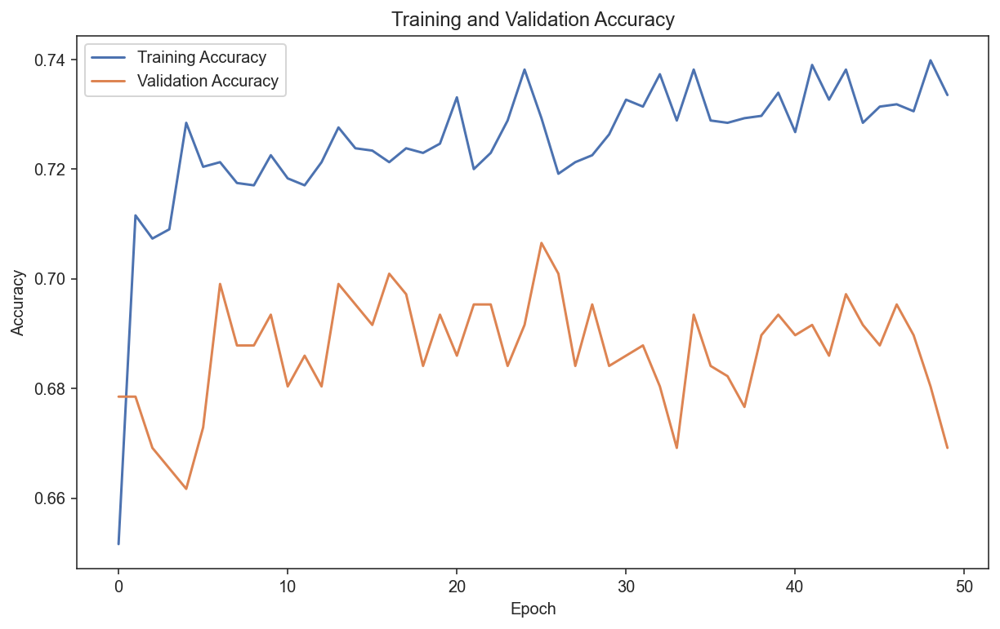

In [ ]:
# Plot training and validation accuracy
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
import numpy as np

# Convert the Pandas DataFrame to a NumPy array
X_val_scale_array = X_val_scale.values

# Reshape the NumPy array to add the channel dimension
X_val_scale_reshaped = X_val_scale_array.reshape(X_val_scale_array.shape[0], X_val_scale_array.shape[1], 1)


In [ ]:
# Evaluate the model on the validation set
valid_loss, valid_acc = model.evaluate(X_val_scale_reshaped, y_val_encoded)

21/21 [==============================] - 0s 1ms/step - loss: 0.5708 - accuracy: 0.7220


In [ ]:
from sklearn.metrics import classification_report
# Convert probabilities to class labels
y_pred_cnn = model.predict(X_val_scale_reshaped);
y_pred_cnn_labels = np.argmax(y_pred_cnn, axis=1)

# Now, you can use classification_report with discrete class labels
class_report_cnn = classification_report(y_val_encoded, y_pred_cnn_labels)
print("\nClassification Report:")
print(class_report_cnn)


21/21 [==============================] - 0s 997us/step

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.68      0.69       298
           1       0.75      0.75      0.75       371

    accuracy                           0.72       669
   macro avg       0.72      0.72      0.72       669
weighted avg       0.72      0.72      0.72       669



21/21 [==============================] - 0s 1ms/step


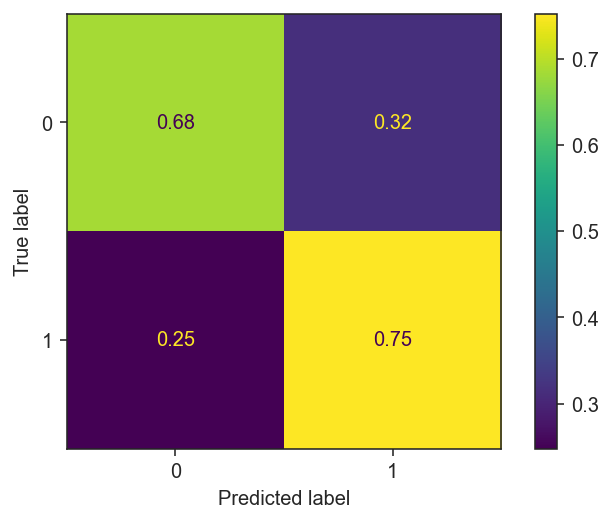

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_val_encoded,np.argmax(model.predict(X_val_scale_reshaped), axis=1),normalize='true')
ConfusionMatrixDisplay(confusion_matrix=cm).plot();